### CS/ECE/ISyE 524 &mdash; Introduction to Optimization &mdash; Summer 2018 ###

# Smart Grid #

#### Group
- **Bryan Luu** (bluu@wisc.edu)
- **Saniya Khullar** (skhullar2@wisc.edu)
- **In Young Cho** (icho3@wisc.edu)

### Table of Contents

1. [Introduction](#1.-Introduction)
1. [Mathematical Model](#2.-Mathematical-model)
1. [Solution](#3.-Solution)
1. [Results and Discussion](#4.-Results-and-Discussion)
1. [Conclusion](#5.-Conclusion)
1. [Appendix](#Appendix)

## 1. Introduction ##
### 1.1 Smart Grids ###
Electricity as a utility is an engineering marvel of the 20th century. Current electric grids are composed of centralized generators providing power to a network of consumers. Separating the consumers from producers has enabled a larger separation of concerns for the electricity user. However, the disadvantages of this are: 
- if the central generators become unavailable, the grid experiences blackouts
- electric resistance over long transmission lines leads to power loss
- consumers have no control over their individual supply of energy

Enter the 21st century, where the emergence of computers and the internet enables the implementation of an intelligent energy network, the [_Smart Grid_](https://www.smartgrid.gov/the_smart_grid/smart_grid.html). Such a grid would be compatible with sources of energy (wind, solar, etc) that are better suited to a distributed system. The idea is that having a distributed set of communicating suppliers allows the network to adapt to changes in demand and supply while reducing loss. Furthermore, the advent of batteries provides storage for times where supply is waning.
<img src="http://media2.govtech.com/images/Smart_Grid_Shutterstock__1_.jpg" alt="drawing" width="700"/>

The advantages of a Smart Grid are:
- energy can be distributed from locations closer to the consumption
- energy can be stored in batteries for insurance
- consumers can gain value by producing their own energy and giving back to the network

The requirements for implementing a Smart Grid can be summarized as follows. First, energy demand of the network should be met at all times. Second, use of the regular centralized grid (which can be sourced from non-renewables) should be minimized. Third, the power lost through transmission, and to battery operations, should be kept to a minimum.

---
### 1.2 Problem Statement ###
This project considers the hypothetical village, _Kakariko Village_, with power demands and supply that mirror real-world values. The village is composed of _household_ nodes and _producer_ nodes, connected via transmission lines to form an electric network that energy will be distributed over. Producer nodes are nodes with access to a power source from which energy can be shared to the network. Household nodes are residential homes which consume energy from the network. 

The producers in Kakariko consist of two wind-turbines ($\alpha, \beta$), a main-grid connection ($\gamma$), and three households with access to solar panels ($K, L, C$). The households (including the solar-panelled houses) form the household nodes (named after the Avengers' + the authors' names): ($S, K, P, L, B, O, C, M, R$). The village network consists of bi-directional edges between nodes which energy can be shared. Each node can either produce, consume, or relay energy via it's connections. The village topography is shown below (where the numbers indicate edge distances in 100s of meters):
<img src="https://i.ibb.co/Nt74Czr/kakarikovillage.png" alt="drawing" width="300"/>

The way energy is defined in such as system is through the use of the energy unit, *kilowatt-hours* (kWh), where 1 kWh = 3.6 million Joules. The power lost through transmission is given by an approximate linear resistive loss function (detailed in [Section 2](#2.-Mathematical-model)).

In reality, demand and supply can shift on the order of minutes, but, for simplicity's sake, only daily energy use was considered. A one week time window was used to analyze the flow and use of energy.

The daily supply of the wind-turbines was generated (conservatively) using standard [real-world averages](https://www.wind-watch.org/faq-output.php) of 12,000 kWh per day. The solar households were estimated to have a maximum daily supply of 4-6 kWh, based on [online research](https://www.solarpowerrocks.com/solar-basics/how-much-electricity-does-a-solar-panel-produce/).

The households' daily energy demand data was constructed using the [average monthly American energy consumption](https://www.eia.gov/tools/faqs/faq.php?id=97&t=3) of 867 kWh. Certain households had a larger demand, depending on the nature of the inhabitant.

In the later model implementations which incorporated batteries, numbers were estimated for the _input_ and _output_ efficiencies as 60% and 80% respectively.

The challenge is to build a model that solves the energy flows given the daily demand and supply, meeting the conditions outlined in [the previous section](#1.1-Smart-Grids):
- demand is met for all nodes on every day
- use of the main grid ($\gamma$) should be minimized
- power losses should be minimized

The model was developed in stages, tackling different cases. These cases are summarized below:
1. **Simplest Case**: First, a plain model of the village with no batteries and no conventional power grid is used. This case is only possible when the power producers can supply enough power for all power demands.
2. **Main-grid Case**: A connection to the main-grid is incorporated as the $\gamma$ station. This station represents a conventional power grid which can supply any shortage from the power producers of a day. However, use of the main-grid will be penalized, with the idea being to de-incentivize power which could be powered by non-renewable sources.
3. **Battery Case**: Maintaining the model up to the main-grid case, batteries at all household nodes were added. Each battery has an energy capacity, with input and output efficiencies.
4. **Sharing Case**: From the battery model, adding a new condition which rewards producers to share their spoils and storage as much as possible, facilitating flow around the network rather than defaulting to using the main-grid ($\gamma$).
5. **No-Cycles Case**: Modified the sharing model to enforce one-directional flows (such that there are no cycles on edges).
6. **Random Case**: Added the ability to create randomized supply and demand data, as well as shortage days.

---

## 2. Mathematical Model ##

This optimization problem is a mixture of minimum-cost network flow (MCNF) problem, a multi-period planing prolem and a tradeoff problem.

1. This is MCNF because there are a set of source nodes that has energy supplies and a set of sink nodes (that may overlap with the set of source nodes) that has energy demands. The edges of the network connect nodes and the sum of all energy flowing on the edges are minimized by resistive power loss proportional to the flow. And at every node, some kind of energy-balancing constraint is expected.

2. This is multi-period planning problem by the use of batteries such that the energy production from the previous day may be related to the energy consumption of the next day. Therefore, a variable dependent on a time $t$ and $t + 1$ is expected. However, there is no backlogging since batteries cannot store negative amount of energy or "lacking" energy, meaning the variable dependent on time must be nonnegative.

3. This is a tradeoff problem because, as the problem becomes more complicated than the previous cases, the terms in the objective may conflict or the priorities of terms compete. Therefore, variations of tradeoff parameters will be introduced as new terms are added into the objective and the analysis of the tradeoff parameters on the performance of the optimization and optimal solutions may be possible.

The data available for modeling stages of smart grid are listed below:

* $Days = $ the set of days when the energy distribution is optimized $= \{1, 2, 3, \dots, T\} = \{1, 2, 3, \dots, 7\}$
* $Nodes = $ the set of nodes in the village or the union of producers and households $= \{\alpha, \beta, \gamma, S, K, P, L, B, O, C, M, R\}$
* $Producers = $ the set of producer nodes $= \{\alpha, \beta, \gamma, K, L, C\}$
* $Edges = $ the set of transmission lines between every pair of nodes
* $d_{ij} = $ distance between nodes $i$ and $j$
* $r_{loss} = $ resistive power loss rate on transmission lines proportional to the distance
* $p_{n, t} = $ energy production from power source at node $n$ on the day $t$
* $c_{n, t} = $ energy consumption of household $n$ on the day $t$
* $\mu = $ main-grid penalty
* $b_{n} = $ capacity of the battery at node $n$
* $\epsilon_{in} = $ energy input efficiency of the batteries
* $\epsilon_{out} = $ energy output efficiency of the batteries
* $\theta = $ price paid for a unit of energy shared
* $\phi = $ regularizer parameter for removing cycles

The transmission lines or edges of the smart grid are bi-directional. That is, a variable that expresses flow on edges can be a free variable and the sign of the value may indicate the direction of the flow. However, for the sake of easier understanding of flows and more intuitive constraint construction e.g. energy balancing at a node, each edge will be considered to consist of two uni-directional edges. Then, the flow on an edge also consists of two directional flows that are non-negative.

\begin{align*}
(i, j) &= \text{A directional edge from node $i$ to node $j$} \in Edges \\
&\neq (j, i) \\
\end{align*}

<div class="alert alert-block alert-warning">
Use of unidirectional flow variable introduces cycles in the network. Cycles may cause solving and analyzing optimization problems difficult but appropriate fixes will be considered if the cycles are actually problematic.
</div>

Throughout the mathematical models for different cases, the following terms are used in common:

\begin{equation*}
\begin{aligned}
SustainDays = &\text{the set of days when the main power grid is not necessary} \\
&\qquad \text{to supply energy to the village} \\
\end{aligned} \\
AddDays = \{Days, T + 1\} = \{Days, 8\} \\
\begin{aligned}
P(x_{ij, t}) &= \text{Energy received at node $j$ after losing a portion of sent energy at node $i$ on the day $t$} \\
&= (1 - r_{loss}d_{ij})x_{ij} \\
\end{aligned} \\
\end{equation*}

The rest of the section covers the following cases:
- [Simplest Case](#2.1-Simplest-Case)
- [Main-Grid Case](#2.2-Main-Grid-Case)
- [Battery Case](#2.3-Battery-Case)
- [Sharing Case](#2.4-Sharing-Case)
- [No-Cycles Case](#2.5-No-Cycles-Case)
- [Random Case](#2.6-Random-Case)

### 2.1 Simplest Case

* **Changes in data for this case**

This simpliest case considers when solar panels and wind turbines are the only energy sources for a day and no conventional main-grid or batteries are used. Since batteries are not modeled yet, there is no changes regarding batteries. However, the main-grid $\gamma$ is modeled in the network and the operation of the main-grid needs to be restricted.

\begin{equation*}
p_{\gamma, t} = 0 \quad\forall t \in SustainDays \\
\end{equation*}

Because there is no battery used in this case, no energy can be stored for the next day, meaning all the energy demands must be met using the energy sources. And it is possible not to use $\gamma$ as long as solar panels and wind turbines can supply enough energy to feed the energy demands of the whole villgae of a day. Therefore, let $SustainDays$ be used instead of $Days$ in this case.

\begin{equation*}
SustainDays = \{1, 2, 3\} \\
\end{equation*}

* **Decision Variables**

From the available data, the flows $x_{ij}$ of all edges need be decided for every days in $SustainDays$.

\begin{equation*}
x_{ij, t} = \text{Energy flow from node $i$ to node $j$ on the day $t$} \quad\forall (i, j) \in Edges, t \in SustainDays \\
\end{equation*}

* **Objective**

The objective is minimizing the sum of resistive power loss on the transmission lines.

\begin{equation*}
\underset{x}{\min} \ \sum_{\substack{(i, j) \in Edges \\ t \in SustainDays}}r_{loss}d_{ij}x_{ij, t} \\
\end{equation*}

* **Constraints**

The only constraint attempts a balance between the sum of energy produced and receeived from neighbors and the sum of energy consumption and redirection at every node. However, the constraint does not use strict equality because there is no need to get maximum capacity of energy production when the sum of demanded and redirected energy is not as much as the maximum capacity of power sources.

\begin{equation*}
{\scriptsize \begin{aligned}
\text{Energy from neighbors} \\
\text{to node $k$ on day $t$} \\
\end{aligned}} + {\scriptsize \begin{aligned}
\text{Energy produced} \\
\text{at node $k$ on day $t$} \\
\end{aligned}} \geq {\scriptsize \begin{aligned}
\text{Energy to neighbors} \\
\text{from node $k$ on day $t$} \\
\end{aligned}} + {\scriptsize \begin{aligned}
\text{Energy to consume} \\
\text{at node $k$ on day $t$} \\
\end{aligned}} \quad\forall \begin{aligned}
&k \in Nodes \\
&t \in SustainDays \\
\end{aligned} \\
\sum_{(i, k) \in Edges}P(x_{ik, t}) + p_{k, t} \geq \sum_{(k, j) \in Edges}x_{kj, t} + c_{k, t} \quad\forall k \in Nodes, t \in SustainDays \\
\end{equation*}

This can be simplified into the following.

\begin{equation*}
-\sum_{(i, k) \in Edges}P(x_{ik, t}) + \sum_{(k, j) \in Edges}x_{kj, t} \leq p_{k, t} - c_{k, t} \quad\forall k \in Nodes, t \in SustainDays \\
\end{equation*}

* **Mathematical model of the simplest case**

\begin{align*}
\underset{x}{\min} \ & \sum_{\substack{(i, j) \in Edges \\ t \in SustainDays}}r_{loss}d_{ij}x_{ij, t} \\
\text{s.t.} \ & -\sum_{(i, k) \in Edges}P(x_{ik, t}) + \sum_{(k, j) \in Edges}x_{kj, t} \leq p_{k, t} - c_{k, t} \quad\forall k \in Nodes, t \in SustainDays \\
& p_{\gamma, t} = 0 \quad\forall t \in SustainDays \\
& x_{ij, t} \geq 0 \quad\forall (i, j) \in Edges, t \in SustainDays \\
\end{align*}

### 2.2 Main-Grid Case

* **There is no changes in data for this case**

* **Decision Variables**

There is no change in decision variables from the simplest case because there is no change in the network except that now $\gamma$ may supply energy.

\begin{equation*}
x_{ij, t} = \text{Energy flow from node $i$ to node $j$ on the day $t$} \geq 0 \quad\forall (i, j) \in Edges, t \in Days \\
\end{equation*}

* **Objective**

The use of $\gamma$ will be penalized proportional to the amount of energy from $\gamma$. And the objective of this case is to minimize the penalty of the main-grid as well as the resistive energy losses.

\begin{equation*}
\underset{x}{\min} \ \sum_{\substack{(i, j) \in Edges \\ t \in Days}}r_{loss}d_{ij}x_{ij, t} + \mu\sum_{\substack{(\gamma, j) \in Edges \\ t \in Days}}x_{\gamma j, t} \\
\end{equation*}

* **Constraints**

Similar to the decision variables, there is no change in the constraint from the simplest case.

\begin{equation*}
-\sum_{(i, k) \in Edges}P(x_{ik, t}) + \sum_{(k, j) \in Edges}x_{kj, t} \leq p_{k, t} - c_{k, t} \quad\forall k \in Nodes, t \in Days \\
\end{equation*}

* **Mathematical model of the main-grid case**

\begin{align*}
\underset{x}{\min} \ & \sum_{\substack{(i, j) \in Edges \\ t \in Days}}r_{loss}d_{ij}x_{ij, t} + \mu\sum_{\substack{(\gamma, j) \in Edges \\ t \in Days}}x_{\gamma j, t} \\
\text{s.t.} \ & -\sum_{(i, k) \in Edges}P(x_{ik, t}) + \sum_{(k, j) \in Edges}x_{kj, t} \leq p_{k, t} - c_{k, t} \quad\forall k \in Nodes, t \in Days \\
& x_{ij, t} \geq 0 \quad\forall (i, j) \in Edges, t \in Days \\
\end{align*}

### 2.3 Battery Case

* **There is no changes in data for this case**

* **Decision Variables**

Now this case assumes that there are batteries installed at every node so that any excess energy of a day can be stored into the batteries. Therefore, new decision variable $s_{n, t}\ \forall n \in Nodes, t \in AddDays$ is defined as shown below in addition to $x_{ij, t}\ \forall (i, j) \in Edges, t \in Days$. Note that there may be excess energy left at the last day of $Days$. This energy can be reformulated in terms of energy available the next day $T + 1 = 8$. This is the reason the definition of $s_{n, t}$ spans over $AddDays$ instead of $Days$.

\begin{equation*}
x_{ij, t} = \text{Energy flow from node $i$ to node $j$ on the day $t$} \geq 0 \quad\forall (i, j) \in Edges, t \in Days \\
s_{n, t} = \text{Energy stored in the battery at node $n$ at the start of day $t$} \geq 0 \quad\forall n \in Nodes, t \in AddDays \\
\end{equation*}

* **Objective**

Because batteries are acting as another energy source different from solar panels and wind turbines, the objective to minimize resistive energy loss on transmission lines does not change. Also, batteries do not affect penalizing use of main-grid $\gamma$ either. Therefore, the objective is the same as the main-grid case except new decision variable $s$ appears.

\begin{equation*}
\underset{x, s}{\min} \ \sum_{\substack{(i, j) \in Edges \\ t \in Days}}r_{loss}d_{ij}x_{ij, t} + \mu\sum_{\substack{(\gamma, j) \in Edges \\ t \in Days}}x_{\gamma j, t} \\
\end{equation*}

* **Constraints**

In order to model battery operation, additional constraints will be added as well as modifying the energy-balancing constraint from the main-grid case to consider energy input and output of batteries.

1. Energy-balancing constraint needs to be changed.

Battery is modeled such that there is an efficiency associated when charging the battery and efficiency when using the battery power. Note that the use of $t$ in either $Days$ or $AddDays$ depends on whether there is any $s_{n, t}$ term showing with $t \notin AddDays$.

\begin{equation*}
\begin{aligned}
\text{Energy from a battery} \\
\text{when the amount of energy stored is $s_{n, t}$} \\
\end{aligned} = \epsilon_{out}s_{n, t} \quad\forall n \in Nodes, t \in AddDays \\
\begin{aligned}
\text{Energy actually stored in a battery} \\
\text{when the amount of energy input is $leftover_{n, t}$} \\
\end{aligned} = \epsilon_{in}leftover_{n, t} = s_{n, t + 1} \quad\forall n \in Nodes, t \in Days \\
\end{equation*}

The batteries act as another source of energy other than solar panels, wind turbines or the main-grid $\gamma$. Therefore, $s_{n, t}\ \forall n \in Nodes, t \in AddDays$ and $leftover_{n, t}\ \forall n \in Nodes, t \in Days$ need to show in the energy-balancing constraint.

\begin{equation*}
-\sum_{(i, k) \in Edges}P(x_{ik, t}) - \epsilon_{out}s_{k, t} + \sum_{(k, j) \in Edges}x_{kj, t} + leftover_{k, t} \leq p_{k, t} - c_{k, t} \quad\forall k \in Nodes, t \in Days \\
leftover_{k, t} \leq \sum_{(i, k) \in Edges}P(x_{ik, t}) + \epsilon_{out}s_{k, t} - \sum_{(k, j) \in Edges}x_{kj, t} + p_{k, t} - c_{k, t} \quad\forall k \in Nodes, t \in Days \\
\end{equation*}

At this point, let all excess energy be stored in the battery (as long as battery capacity allows).

\begin{equation*}
leftover_{k, t} = \sum_{(i, k) \in Edges}P(x_{ik, t}) + \epsilon_{out}s_{k, t} - \sum_{(k, j) \in Edges}x_{kj, t} + p_{k, t} - c_{k, t} \quad\forall k \in Nodes, t \in Days \\
s_{k, t + 1} = \epsilon_{in}leftover_{k, t} \quad\forall k \in Nodes, t \in Days \\
leftover_{k, t} = \frac{1}{\epsilon_{in}}s_{k, t + 1} \quad\forall k \in Nodes, t \in Days \\
\end{equation*}

Then, the energy-balancing constraint becomes the following.

\begin{equation*}
-\sum_{(i, k) \in Edges}P(x_{ik, t}) - \epsilon_{out}s_{k, t} + \sum_{(k, j) \in Edges}x_{kj, t} + \frac{1}{\epsilon_{in}}s_{k, t + 1} \leq p_{k, t} - c_{k, t} \quad\forall k \in Nodes, t \in Days \\
\end{equation*}

2. The batteries cannot store infinite amount of energy but have battery capacities.

\begin{equation*}
s_{n, t} \leq b_{n} \quad\forall n \in Nodes, t \in AddDays \\
\end{equation*}

3. Assume the batteries are empty at the start of the first day $t = 1$.

\begin{equation*}
s_{n, 1} = 0 \quad\forall n \in Nodes \\
\end{equation*}

* **Mathematical model of the battery case**

\begin{align*}
\underset{x, s}{\min} \ & \sum_{\substack{(i, j) \in Edges \\ t \in Days}}r_{loss}d_{ij}x_{ij, t} + \mu\sum_{\substack{(\gamma, j) \in Edges \\ t \in Days}}x_{\gamma j, t} \\
\text{s.t.} \ & -\sum_{(i, k) \in Edges}P(x_{ik, t}) - \epsilon_{out}s_{k, t} + \sum_{(k, j) \in Edges}x_{kj, t} + \frac{1}{\epsilon_{in}}s_{k, t + 1} \leq p_{k, t} - c_{k, t} \quad\forall k \in Nodes, t \in Days \\
& s_{k, t} \leq b_{k} \quad\forall k \in Nodes, t \in AddDays \\
& s_{n, 1} = 0 \quad\forall n \in Nodes \\
& x_{ij, t} \geq 0 \quad\forall (i, j) \in Edges, t \in Days \\
& s_{k, t} \geq 0 \quad\forall k \in Nodes, t \in AddDays \\
\end{align*}

### 2.4 Sharing Case

* **There is no changes in data for this case**

* **Decision Variables**

Since incentivizing excess energy sharing is simply adjusting distributed energy $x_{ij, t}\ \forall (i, j) \in Edges, t \in Days$, there is no change in decision variables.

\begin{equation*}
x_{ij, t} = \text{Energy flow from node $i$ to node $j$ on the day $t$} \geq 0 \quad\forall (i, j) \in Edges, t \in Days \\
s_{n, t} = \text{Energy stored in the battery at node $n$ at the start of day $t$} \geq 0 \quad\forall n \in Nodes, t \in AddDays \\
\end{equation*}

* **Objective**

Sharing of excess energy from "clean" power source is encouraged by maximizaing the money paid to the producers, except the main-grid $\gamma$, who share more energy if possible. Note that encouraging the main-grid $\gamma$ to share more energy increases flows from $\gamma$ which conflicts with minimizing the flows by penalizing the use of the main-grid. Since the formulation of the optimization problem has been minimization so far, maximizing overall revenue of the producers except $\gamma$ will be converted into the following when $sharing_{n, t}$ is defined to be amount of excess energy shared from producer node $n \neq \gamma$ on day $t$.

\begin{equation*}
\max\ \theta\sum_{\substack{k \in Producers \\ k \neq \gamma \\ t \in Days}}sharing_{k, t} \iff -\min\ \theta\sum_{\substack{k \in Producers \\ k \neq \gamma \\ t \in Days}}sharing_{k, t} \\
\end{equation*}

Here, one needs to keep in mind that $sharing_{n, t}\ \forall n \in Producers, n \neq \gamma, t \in Days$ should be **excess** energy that is bounded by $leftover_{n, t}\ \forall n \in Producers, n \neq \gamma, t \in Days$. And the calculation of $leftover_{n, t}\ \forall n \in Producers, n \neq \gamma t \in Days$ is already discussed in the battery case.

\begin{equation*}
leftover_{k, t} = \sum_{(i, k) \in Edges}P(x_{ik, t}) + \epsilon_{out}s_{k, t} - \sum_{(k, j) \in Edges}x_{kj, t} + p_{k, t} - c_{k, t} \quad\forall \begin{aligned}
&k \in Producers, k \neq \gamma \\
&t \in Days \\
\end{aligned} \\
\end{equation*}

If there is excess energy at producer node $k \neq \gamma$ on day $t$, $leftover_{k, t} \geq 0$.

\begin{equation*}
leftover_{k, t} = \sum_{(i, k) \in Edges}P(x_{ik, t}) + \epsilon_{out}s_{k, t} - \sum_{(k, j) \in Edges}x_{kj, t} + p_{k, t} - c_{k, t} \geq 0 \\
-\sum_{(i, k) \in Edges}P(x_{ik, t}) + \sum_{(k, j) \in Edges}x_{kj, t} \leq \epsilon_{out}s_{k, t} + p_{k, t} - c_{k, t} \\
\end{equation*}

And when there is excess energy at node $k$, it means that the node has managed to cover energy consumption from energy in battery and energy productions, yet unused energy independent of the incoming energy from neighbors $\sum_{(i, k) \in Edges}P(x_{ik, t})$ is left. If a portion is stored in energy, that portion does not appear in $\sum_{(k, j) \in Edges}x_{kj, t}$. If the remaining is shared, it will appear in $\sum_{(k, j) \in Edges}x_{kj, t} = \sum_{(i, k) \in Edges}P(x_{ik, t}) + sharing_{k, t}$.

\begin{equation*}
%-\sum_{(i, k) \in Edges}P(x_{ik, t}) + \sum_{(k, j) \in Edges}x_{kj, t} = sharing_{k, t} \leq \lambda_{out}s_{k, t} + b_{k, t} \\
sharing_{k, t} = -\sum_{(i, k) \in Edges}P(x_{ik, t}) + \sum_{(k, j) \in Edges}x_{kj, t} \quad\forall k \in Producers, k \neq \gamma, t \in Days \\
\end{equation*}

And the following is the additional term in the objective.

\begin{equation*}
-\min\ \theta\sum_{\substack{k \in Producers \\ k \neq \gamma \\ t \in Days}} {\Large(}-\sum_{(i, k) \in Edges}P(x_{ik, t}) + \sum_{(k, j) \in Edges}x_{kj, t}{\Large)} \\
\end{equation*}

And the following summarizes the updated objective.

\begin{equation*}
\underset{x, s}{\min} \ \sum_{\substack{(i, j) \in Edges \\ t \in Days}}r_{loss}d_{ij}x_{ij, t} + \mu\sum_{\substack{(\gamma, j) \in Edges \\ t \in Days}}x_{\gamma j, t} - \theta\sum_{\substack{k \in Producers \\ k \neq \gamma \\ t \in Days}} {\Large(}-\sum_{(i, k) \in Edges}P(x_{ik, t}) + \sum_{(k, j) \in Edges}x_{kj, t}{\Large)} \\
\end{equation*}

* **Constraints**

In addition to the energy-balancing constraint and battery modeling constraints, shared energy bounding constraint is necessary.

1. Shared energy bounding constraint

If there is a producer node $n \neq \gamma$ who wants to make as much revenue as possible, no constraint prohibit the producer sharing or dumping as much produced energy as it can. Therefore, there should be an upper bound on the shared energy. And the upper bound can be calculated when a net inflow of a consumer node $n \notin Producers$ is considered, which should not be more than the amount the node can consume. And this constraint can be expanded over all the nodes because producer nodes also do not want to receive more than what it can consume.

\begin{equation*}
\sum_{(i, k) \in Edges}P(x_{ik, t}) - \sum_{(k, j) \in Edges}x_{kj, t} \leq c_{k, t} + \frac{1}{\epsilon_{in}}s_{k, t + 1} \quad\forall k \in Nodes, t \in Days \\
\end{equation*}

2. As there is no change in overall energy balancing constraint because any shared energy will be combined into $x_{ij, t}\ \forall (i, j) \in Edges, t \in Days$ in the constraint.

\begin{equation*}
-\sum_{(i, k) \in Edges}P(x_{ik, t}) - \epsilon_{out}s_{k, t} + \sum_{(k, j) \in Edges}x_{kj, t} + \frac{1}{\epsilon_{in}}s_{k, t + 1} \leq p_{k, t} - c_{k, t} \quad\forall k \in Nodes, t \in Days \\
\end{equation*}

3. Battery modeling is not changes and so do battery modeling constraints.

\begin{equation*}
s_{n, t} \leq b_{n} \quad\forall n \in Nodes, t \in AddDays \\
s_{n, 1} = 0 \quad\forall n \in Nodes \\
\end{equation*}

* **Mathematical model of the sharing case**

\begin{align*}
\underset{x, s}{\min} \ & \sum_{\substack{(i, j) \in Edges \\ t \in Days}}r_{loss}d_{ij}x_{ij, t} + \mu\sum_{\substack{(\gamma, j) \in Edges \\ t \in Days}}x_{\gamma j, t} - \theta\sum_{\substack{k \in Producers \\ k \neq \gamma \\ t \in Days}} {\Large(}-\sum_{(i, k) \in Edges}P(x_{ik, t}) + \sum_{(k, j) \in Edges}x_{kj, t}{\Large)} \\
\text{s.t.} \ & -\sum_{(i, k) \in Edges}P(x_{ik, t}) - \epsilon_{out}s_{k, t} + \sum_{(k, j) \in Edges}x_{kj, t} + \frac{1}{\epsilon_{in}}s_{k, t + 1} \leq p_{k, t} - c_{k, t} \quad\forall k \in Nodes, t \in Days \\
& s_{n, t} \leq b_{n} \quad\forall n \in Nodes, t \in AddDays \\
& s_{n, 1} = 0 \quad\forall n \in Nodes \\
& \sum_{(i, k) \in Edges}P(x_{ik, t}) - \sum_{(k, j) \in Edges}x_{kj, t} \leq c_{k, t} + \frac{1}{\epsilon_{in}}s_{k, t + 1} \quad\forall k \in Nodes, t \in Days \\
& x_{ij, t} \geq 0 \quad\forall (i, j) \in Edges, t \in Days \\
& s_{k, t} \geq 0 \quad\forall k \in Nodes, t \in AddDays \\
\end{align*}

### 2.5 No-Cycles Case

* **There is no changes in data for this case**

* **Constraints**

When the price for shared energy is high enough, producers start to exploit sharing energy more than what the village needs. This excess energy floating in the network may cause a cycle. Therefore, cycle-removing constraints need to be added while the constraints from the sharing case do not change.

\begin{equation*}
-\sum_{(i, k) \in Edges}P(x_{ik, t}) - \epsilon_{out}s_{k, t} + \sum_{(k, j) \in Edges}x_{kj, t} + \frac{1}{\epsilon_{in}}s_{k, t + 1} \leq p_{k, t} - c_{k, t} \quad\forall k \in Nodes, t \in Days \\
s_{n, t} \leq b_{n} \quad\forall n \in Nodes, t \in AddDays \\
s_{n, 1} = 0 \quad\forall n \in Nodes \\
\sum_{(i, k) \in Edges}P(x_{ik, t}) - \sum_{(k, j) \in Edges}x_{kj, t} \leq c_{k, t} + \frac{1}{\epsilon_{in}}s_{k, t + 1} \quad\forall k \in Nodes, t \in Days \\
\end{equation*}

A cycle occurs even on a single edge between node $i$ and node $j$ on day $t$.

\begin{equation*}
\text{Cycle when } x_{ij, t} \gt 0 \text{ and } x_{ji, t} \gt 0 \\
x_{ij, t} + x_{ji, t} \gt max(x_{ij, t}, x_{ji, t}) \\
\end{equation*}

In order to break this cycle, one of the flows must be $0$.

\begin{equation*}
\text{No cycle when } x_{ij, t} = 0 \text{ or } x_{ji, t} = 0 \quad\forall (i, j) \in Edges, t \in Days \\
x_{ij, t} + x_{ji, t} = \max(x_{ij, t}, x_{ji, t}) \quad\forall (i, j) \in Edges, t \in Days \\
\end{equation*}

Epigraph trick may be used with an epigraph variables $y_{ij, t}\ \forall (i, j) \in Edges, t \in Days$ to implement $\max$ operation. Note that the new epigraph variables define upper bounds on each edge regardless of the direction of the unidirectional edge, meaning the epigraph variable in one direction of the edge is the epigraph variable of the other direction.

\begin{equation*}
y_{ij, t} = \text{Epigraph variable of the sum of absolute values of flows on edge between $i$ and $j$ on day $t$} \geq 0 \\
y_{ij, t} = y_{ji, t} \quad\forall (i, j) \in Edges, t \in Days \\
x_{ij, t} + x_{ji, t} = \max(x_{ij, t}, x_{ji, t}) \leq y_{ij, t} \quad\forall (i, j) \in Edges, t \in Days \\
\end{equation*}

Since $y_{ij, t}\ \forall (i, j) \in Edges, t \in Days$ can be arbitrarily large, which may not enforce either $x_{ij, t} = 0\ \forall (i, j) \in Edges, t \in Days$ or $x_{ji, t} = 0\ \forall (i, j) \in Edges, t \in Days$, the minimum of the epigraph variable is necessary.

\begin{equation*}
x_{ij, t} + x_{ji, t} = \max(x_{ij, t}, x_{ji, t}) = \min(y_{ij, t}) \quad\forall (i, j) \in Edges, t \in Days \\
\end{equation*}

Minimizing variables cannot be done in constraint of a mathematical model but in objective. And all the epigraph variables need to be minimized.

Assuming that the objective function minimizes the epigraph variables as much as possible such that $y_{ij, t} = \max(x_{ij, t}, x_{ji, t})\ \forall (i, j) \in Edges, t \in Days$, any cycle is removed. And if there is no cycle, the followings are the only two possible cases.

\begin{equation*}
\begin{cases}
0 + x_{ji, t} = y_{ij, t} & \text{if } x_{ij, t} = 0 \quad\forall (i, j) \in Edges, t \in Days \\
x_{ij, t} + 0 = y_{ij, t} & \text{if } x_{ji, t} = 0 \quad\forall (i, j) \in Edges, t \in Days \\
\end{cases} \\
\end{equation*}

From the only two cases of having no cycle, the following is the range of values of flow.

\begin{equation*}
0 \leq x_{ij, t} \leq y_{ij, t} = \max(x_{ij, t}, x_{ji, t}) \quad\forall (i, j) \in Edges, t \in Days \\
0 \leq x_{ji, t} \leq y_{ji, t} = \max(x_{ij, t}, x_{ji, t}) \quad\forall (i, j) \in Edges, t \in Days \\
\end{equation*}

Therefore, the following summarizes the constraints that remove any cycle.

\begin{equation*}
y_{ij, t} = y_{ji, t} \quad\forall (i, j) \in Edges, t \in Days \\
x_{ij, t} + x_{ji, t} = y_{ij, t} \quad\forall (i, j) \in Edges, t \in Days \\
x_{ij, t} \leq y_{ij, t} \quad\forall (i, j) \in Edges, t \in Days \\
\end{equation*}

* **Decision Variables**

The epigraph variable $y$ has been added.

\begin{equation*}
x_{ij, t} = \text{Energy flow from node $i$ to node $j$ on the day $t$} \geq 0 \quad\forall (i, j) \in Edges, t \in Days \\
s_{n, t} = \text{Energy stored in the battery at node $n$ at the start of day $t$} \geq 0 \quad\forall n \in Nodes, t \in AddDays \\
y_{ij, t} = \text{Epigraph variable of the sum of absolute values of flows on edge between $i$ and $j$ on day $t$} \geq 0 \\
\end{equation*}

* **Objective**

Cycle-removing constraints are effective as long as the epigraph variables $y_{ij, t}\ \forall (i, j) \in Edges, t \in Days$ are minimized. The minimum epigraph variables can be found by minimizing the following term in the objective.

\begin{equation*}
\sum_{\substack{(i, j) \in Edges \\ t \in Days}}y_{ij, t} \\
\end{equation*}

When adding the new term in the objective of the mathematical model, a tradeoff parameter $\phi$ is introduced. Therefore, the new objective becomes the following.

\begin{align*}
\underset{x, s, y}{\min} \ &\sum_{\substack{(i, j) \in Edges \\ t \in Days}}r_{loss}d_{ij}x_{ij, t} + \mu\sum_{\substack{(\gamma, j) \in Edges \\ t \in Days}}x_{\gamma j, t} \\
& \qquad - \theta\sum_{\substack{k \in Producers \\ k \neq \gamma \\ t \in Days}} {\Large(}-\sum_{(i, k) \in Edges}P(x_{ik, t}) + \sum_{(k, j) \in Edges}x_{kj, t}{\Large)} + \phi\sum_{\substack{(i, j) \in Edges \\ t \in Days}}y_{ij, t} \\
\end{align*}

* **Mathematical model of the no-cycles case**

\begin{align*}
\underset{x, s, y}{\min} \ & \sum_{\substack{(i, j) \in Edges \\ t \in Days}}r_{loss}d_{ij}x_{ij, t} + \mu\sum_{\substack{(\gamma, j) \in Edges \\ t \in Days}}x_{\gamma j, t} \\
& \qquad - \theta\sum_{\substack{k \in Producers \\ k \neq \gamma \\ t \in Days}} {\Large(}-\sum_{(i, k) \in Edges}P(x_{ik, t}) + \sum_{(k, j) \in Edges}x_{kj, t}{\Large)} + \phi\sum_{\substack{(i, j) \in Edges \\ t \in Days}}y_{ij, t} \\
\text{s.t.} \ & -\sum_{(i, k) \in Edges}P(x_{ik, t}) - \epsilon_{out}s_{k, t} + \sum_{(k, j) \in Edges}x_{kj, t} + \frac{1}{\epsilon_{in}}s_{k, t + 1} \leq p_{k, t} - c_{k, t} \quad\forall k \in Nodes, t \in Days \\
& s_{n, t} \leq b_{n} \quad\forall n \in Nodes, t \in AddDays \\
& s_{n, 1} = 0 \quad\forall n \in Nodes \\
& \sum_{(i, k) \in Edges}P(x_{ik, t}) - \sum_{(k, j) \in Edges}x_{kj, t} \leq c_{k, t} + \frac{1}{\epsilon_{in}}s_{k, t + 1} \quad\forall k \in Nodes, t \in Days \\
& y_{ij, t} = y_{ji, t} \quad\forall (i, j) \in Edges, t \in Days \\
& x_{ij, t} + x_{ji, t} = y_{ij, t} \quad\forall (i, j) \in Edges, t \in Days \\
& x_{ij, t} \leq y_{ij, t} \quad\forall (i, j) \in Edges, t \in Days \\
& x_{ij, t} \geq 0 \quad\forall (i, j) \in Edges, t \in Days \\
& s_{k, t} \geq 0 \quad\forall k \in Nodes, t \in AddDays \\
& y_{ij, t} \geq 0 \quad\forall (i, j) \in Edges, t \in Days \\
\end{align*}

### 2.6 Random Case

* **In this case, data are modified to be random if necessary.**

$r_{loss}$, $\mu$, $\theta$, $\phi$ may change to some other values.

$d_{ij}$, $p_{n, t}$ and $c_{n, t}$ may be randomized.

$Days$, $b_{n}$, $\epsilon_{in}$, $\epsilon_{out}$ are not changed.

* **Decision Variables**

There is no change in decision variables from the no-cycles case for randomizing data.

\begin{equation*}
x_{ij, t} = \text{Energy flow from node $i$ to node $j$ on the day $t$} \geq 0 \quad\forall (i, j) \in Edges, t \in Days \\
s_{n, t} = \text{Energy stored in the battery at node $n$ at the start of day $t$} \geq 0 \quad\forall n \in Nodes, t \in AddDays \\
y_{ij, t} = \text{Epigraph variable of the sum of absolute values of flows on edge between $i$ and $j$ on day $t$} \geq 0 \\
\end{equation*}

* **Constraints**

There is no change in constraints from the no-cycles case for randomizing data.

\begin{equation*}
-\sum_{(i, k) \in Edges}P(x_{ik, t}) - \epsilon_{out}s_{k, t} + \sum_{(k, j) \in Edges}x_{kj, t} + \frac{1}{\epsilon_{in}}s_{k, t + 1} \leq p_{k, t} - c_{k, t} \quad\forall k \in Nodes, t \in Days \\
s_{n, t} \leq b_{n} \quad\forall n \in Nodes, t \in AddDays \\
s_{n, 1} = 0 \quad\forall n \in Nodes \\
\sum_{(i, k) \in Edges}P(x_{ik, t}) - \sum_{(k, j) \in Edges}x_{kj, t} \leq c_{k, t} + \frac{1}{\epsilon_{in}}s_{k, t + 1} \quad\forall k \in Nodes, t \in Days \\
y_{ij, t} = y_{ji, t} \quad\forall (i, j) \in Edges, t \in Days \\
x_{ij, t} + x_{ji, t} = y_{ij, t} \quad\forall (i, j) \in Edges, t \in Days \\
x_{ij, t} \leq y_{ij, t} \quad\forall (i, j) \in Edges, t \in Days \\
\end{equation*}

* **Objective**

There is no change in objective from the no-cycles case for randomizing data.

\begin{align*}
\underset{x, s, y}{\min} \ &\sum_{\substack{(i, j) \in Edges \\ t \in Days}}r_{loss}d_{ij}x_{ij, t} + \mu\sum_{\substack{(\gamma, j) \in Edges \\ t \in Days}}x_{\gamma j, t} \\
& \qquad - \theta\sum_{\substack{k \in Producers \\ k \neq \gamma \\ t \in Days}} {\Large(}-\sum_{(i, k) \in Edges}P(x_{ik, t}) + \sum_{(k, j) \in Edges}x_{kj, t}{\Large)} + \phi\sum_{\substack{(i, j) \in Edges \\ t \in Days}}y_{ij, t} \\
\end{align*}

* **Mathematical model of the random case**

\begin{align*}
\underset{x, s, y}{\min} \ & \sum_{\substack{(i, j) \in Edges \\ t \in Days}}r_{loss}d_{ij}x_{ij, t} + \mu\sum_{\substack{(\gamma, j) \in Edges \\ t \in Days}}x_{\gamma j, t} \\
& \qquad - \theta\sum_{\substack{k \in Producers \\ k \neq \gamma \\ t \in Days}} {\Large(}-\sum_{(i, k) \in Edges}P(x_{ik, t}) + \sum_{(k, j) \in Edges}x_{kj, t}{\Large)} + \phi\sum_{\substack{(i, j) \in Edges \\ t \in Days}}y_{ij, t} \\
\text{s.t.} \ & -\sum_{(i, k) \in Edges}P(x_{ik, t}) - \epsilon_{out}s_{k, t} + \sum_{(k, j) \in Edges}x_{kj, t} + \frac{1}{\epsilon_{in}}s_{k, t + 1} \leq p_{k, t} - c_{k, t} \quad\forall k \in Nodes, t \in Days \\
& s_{n, t} \leq b_{n} \quad\forall n \in Nodes, t \in AddDays \\
& s_{n, 1} = 0 \quad\forall n \in Nodes \\
& \sum_{(i, k) \in Edges}P(x_{ik, t}) - \sum_{(k, j) \in Edges}x_{kj, t} \leq c_{k, t} + \frac{1}{\epsilon_{in}}s_{k, t + 1} \quad\forall k \in Nodes, t \in Days \\
& y_{ij, t} = y_{ji, t} \quad\forall (i, j) \in Edges, t \in Days \\
& x_{ij, t} + x_{ji, t} = y_{ij, t} \quad\forall (i, j) \in Edges, t \in Days \\
& x_{ij, t} \leq y_{ij, t} \quad\forall (i, j) \in Edges, t \in Days \\
& x_{ij, t} \geq 0 \quad\forall (i, j) \in Edges, t \in Days \\
& s_{k, t} \geq 0 \quad\forall k \in Nodes, t \in AddDays \\
& y_{ij, t} \geq 0 \quad\forall (i, j) \in Edges, t \in Days \\
\end{align*}

---

## 3. Solution

In this section, the code is developed for each of the cases described in the [Problem Statement](#1.2-Problem-Statement):
- [Simplest Case](#3.1-Simplest-Case)
- [Main-Grid Case](#3.2-Main-Grid-Case)
- [Battery Case](#3.3-Battery-Case)
- [Sharing Case](#3.4-Sharing-Case)
- [No-Cycles Case](#3.5-No-Cycles-Case)
- [Random Case](#3.6-Random-Case)

### 3.1 Simplest Case

The simple model involved a network excluding the main-grid (no $\gamma$ node), analyzed over 3 days. The data for the model, including the nodes, edges, supply and demand is below:

In [3]:
# Data
using NamedArrays

nodes = [:S, :K, :P, :gamma, :L, :B, :O, :beta, :C, :M, :R, :alpha] # all nodes
us = [:K, :L, :C] # authors' households
producers = [us..., :gamma, :beta, :alpha] # producers
consumers = [:S, :K, :P, :L, :B, :O, :C, :M, :R] # consumers

oneway_arcs = [(:K, :P), (:S, :P), (:P, :L), (:P, :gamma), 
    (:gamma, :B), (:gamma, :L), (:gamma, :R), (:L, :B), (:B, :O),
    (:O, :beta), (:beta, :R), (:beta, :C), (:beta, :M),
    (:alpha, :gamma), (:alpha, :S), (:alpha, :R)] # unique set of edge pairs
arcs = [oneway_arcs; [(j, i) for (i, j) in oneway_arcs]] # add the flipped edges to complete the set

dist_vec = [1, 2, 6, 3, 4, 5, 7, 5, 3, 4, 2, 2, 3, 5, 5, 5]*100 # distance in m
distance = Dict(zip(arcs, [dist_vec; dist_vec]))

# Time Window for Analysis
days = [:Weds, :Thurs, :Fri]

# calculate useful set sizes
N = length(nodes)
T = length(days)
E = length(arcs)

# Resistance
resistance = 0.0001

# construct demand matrix
matrix = zeros(length(nodes), length(days))
demand = NamedArray(matrix, (nodes, days), ("Consumer","Day"))
demand[:S, :Weds]=40.8; demand[:S, :Thurs]=100; demand[:S, :Fri]=50.5;
demand[:P, :Weds]=28.8; demand[:P, :Thurs]=30.3; demand[:P, :Fri]=28.8;
demand[:K, :Weds]=27.3; demand[:K, :Thurs]=27.3; demand[:K, :Fri]=27.3;
demand[:L, :Weds]=30.1; demand[:L, :Thurs]=28.8; demand[:L, :Fri]=27.3;
demand[:C, :Weds]=30.0; demand[:C, :Thurs]=25.5; demand[:C, :Fri]=31.2;
demand[:B, :Weds]=30.1; demand[:B, :Thurs]=31.5; demand[:B, :Fri]=30.1;
demand[:O, :Weds]=13.7; demand[:O, :Thurs]=8.3; demand[:O, :Fri]=16.4;
demand[:M, :Weds]=27.3; demand[:M, :Thurs]=21.9; demand[:M, :Fri]=24.6;
demand[:R, :Weds]=19.2; demand[:R, :Thurs]=20.5; demand[:R, :Fri]=20.5;

# construct supply matrix
matrix = zeros(length(nodes), length(days))
supply = NamedArray(matrix, (nodes, days), ("Producer","Day"))
supply[:alpha, :Weds] = 1500; supply[:alpha, :Thurs] = 300; supply[:alpha, :Fri] = 7000;
supply[:beta, :Weds] = 2500; supply[:beta, :Thurs] = 200; supply[:beta, :Fri] = 5000;
supply[:L, :Weds] = 1500; supply[:L, :Thurs] = 2000; supply[:L, :Fri] = 1500;
supply[:K, :Weds] = 2000; supply[:K, :Thurs] = 1500; supply[:K, :Fri] = 1000;
supply[:C, :Weds] = 1500; supply[:C, :Thurs] = 2300; supply[:C, :Fri] = 1800;

println("Demand: ", demand[consumers, :])
println("Supply: ", supply[producers, :])

Demand: 9×3 Named Array{Float64,2}
Consumer ╲ Day │  :Weds  :Thurs    :Fri
───────────────┼───────────────────────
:S             │   40.8   100.0    50.5
:K             │   27.3    27.3    27.3
:P             │   28.8    30.3    28.8
:L             │   30.1    28.8    27.3
:B             │   30.1    31.5    30.1
:O             │   13.7     8.3    16.4
:C             │   30.0    25.5    31.2
:M             │   27.3    21.9    24.6
:R             │   19.2    20.5    20.5
Supply: 6×3 Named Array{Float64,2}
Producer ╲ Day │  :Weds  :Thurs    :Fri
───────────────┼───────────────────────
:K             │ 2000.0  1500.0  1000.0
:L             │ 1500.0  2000.0  1500.0
:C             │ 1500.0  2300.0  1800.0
:gamma         │    0.0     0.0     0.0
:beta          │ 2500.0   200.0  5000.0
:alpha         │ 1500.0   300.0  7000.0


The `GraphPlot`, `LightGraphs`, and `Colors` libraries were used to implement a helper function, `plot_flows` to help visualize the solution to the model. This is shown in the [Appendix](#Flow-Plotting-Function-(plot_flow)).

#### 3.1.1 First Attempt Model
The village was modelled without the main-grid included using the mathematical model described in [Section 2](#2.1-Simplest Case).

------Solution------
Total energy losses will be 30801.899999999958 kWh.
--- Graph Details ---
Below we plot the flows for each day. Green nodes are contributing a lot of energy into the network. Red nodes are absorbing energy from the network. Grey nodes are neutral. The flows are displayed on the destination end of each edge. High flow edges are colored green. Starred labels denote producers.
--- Weds ---


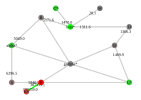

--- Thurs ---


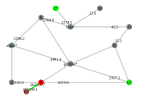

--- Fri ---


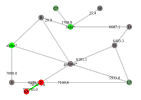

In [4]:
# m: Simplest Case
using Clp, JuMP

m = Model(solver=ClpSolver())

@variable(m, x[arcs, days] >= 0) # energy flow from node i to j

# Useful expressions
@expression(m, flow_in[k in nodes, t in days], 
    sum((1-resistance*distance[(i,j)])*x[(i,j), t] for (i,j) in arcs if j == k)) # flow into node k (including loss)
@expression(m, flow_out[k in nodes, t in days], 
    sum(x[(i,j), t] for (i,j) in arcs if i == k)) # flow out of node k
@expression(m, energy_lost, sum(resistance*distance[a]*x[a, t] for a in arcs for t in days)) # total energy lost
@expression(m, net_outflow[k in nodes, t in days], flow_out[k, t] - flow_in[k, t]) # net flow out of node k
                                
# power balance for node k on day t                                                                                                                                        
@constraint(m, power_balance[k in nodes, t in days], net_outflow[k, t] == supply[k, t] - demand[k,t])

# energy lost through transmission
@objective(m, Min, energy_lost)
                                                
status = solve(m)

println("------Solution------")
# println("Flow: ", getvalue(x))
println("Total energy losses will be ", getvalue(energy_lost), " kWh.")
println("--- Graph Details ---")
println("Below we plot the flows for each day. Green nodes are contributing a lot of energy into the network. "*
        "Red nodes are absorbing energy from the network. Grey nodes are neutral. "*
        "The flows are displayed on the destination end of each edge. High flow edges are colored green. "*
        "Starred labels denote producers.")                                                
for day in days
    flow = Dict(zip(arcs, [getvalue(x[a, day]) for a in arcs]))
    println("--- ", day, " ---")
    sleep(0.5)
    plot_flow(flow)
end


Here we can see the presence of a large cycle between nodes $K, P$. Because of this observation, the power balance constraint was modified to have an inequality to allow for excess energy generation and reduce saturation.

#### 3.1.2 Successful Simplest Model

------Solution------
Total energy losses will be 16.701080265710917 kWh.
--- Weds ---


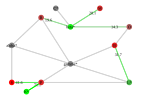

--- Thurs ---


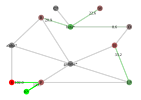

--- Fri ---


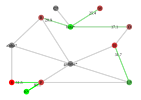

In [5]:
# m: Simplest Case with correction
using Clp, JuMP

m = Model(solver=ClpSolver())

@variable(m, x[arcs, days] >= 0) # energy flow from node i to j

# Useful expressions
@expression(m, flow_in[k in nodes, t in days], 
    sum((1-resistance*distance[(i,j)])*x[(i,j), t] for (i,j) in arcs if j == k)) # flow into node k (including loss)
@expression(m, flow_out[k in nodes, t in days], 
    sum(x[(i,j), t] for (i,j) in arcs if i == k)) # flow out of node k
@expression(m, energy_lost, sum(resistance*distance[a]*x[a, t] for a in arcs for t in days)) # total energy lost
@expression(m, net_outflow[k in nodes, t in days], flow_out[k, t] - flow_in[k, t]) # net flow out of node k
                                
# power balance for node k on day t, note that it is an inequality now!                                                                                                                                       
@constraint(m, power_balance[k in nodes, t in days], net_outflow[k, t] <= supply[k, t] - demand[k,t])

# energy lost through transmission
@objective(m, Min, energy_lost)
                                                
status = solve(m)

println("------Solution------")
# println("Flow: ", getvalue(x))
println("Total energy losses will be ", getvalue(energy_lost), " kWh.")
                                           
for day in days
    flow = Dict(zip(arcs, [getvalue(x[a, day]) for a in arcs]))
    println("--- ", day, " ---")
    sleep(0.5)
    plot_flow(flow)
end


### 3.2 Main Grid Case

Continuing from the [successful simplest model](#3.1.1-Successful-Simplest-Model), the main-grid connection (provided by the $\gamma$ node) was implemented. 

This was done first by adding a generous supply of 10000 kWh for $\gamma$, and adding a fourth day with no wind generation to create a shortage of power which $\gamma$ can fill.

In [6]:
# using four days now instead of 3
days = [1:4;]

matrix = zeros(length(nodes), length(days))
demand = NamedArray(matrix, (nodes, days), ("Consumer","Day"))
demand[:S, 1]=40.8; demand[:S, 2]=100; demand[:S, 3]=50.5; demand[:S, 4]=150.8;
demand[:P, 1]=28.8; demand[:P, 2]=30.3; demand[:P, 3]=28.8; demand[:P, 4]=20.5;
demand[:K, 1]=27.3; demand[:K, 2]=27.3; demand[:K, 3]=27.3; demand[:K, 4]=50.5;
demand[:L, 1]=30.1; demand[:L, 2]=28.8; demand[:L, 3]=27.3; demand[:L, 4]=55.2;
demand[:C, 1]=30.0; demand[:C, 2]=25.5; demand[:C, 3]=31.2; demand[:C, 4]=45.5;
demand[:B, 1]=30.1; demand[:B, 2]=31.5; demand[:B, 3]=30.1; demand[:B, 4]=35.1;
demand[:O, 1]=13.7; demand[:O, 2]=8.3; demand[:O, 3]=16.4; demand[:O, 4]=36.7;
demand[:M, 1]=27.3; demand[:M, 2]=21.9; demand[:M, 3]=24.6; demand[:M, 4]=28.9;
demand[:R, 1]=19.2; demand[:R, 2]=20.5; demand[:R, 3]=20.5; demand[:R, 4]=20.0;

# note: no wind power on day 4
matrix = zeros(length(nodes), length(days))
supply = NamedArray(matrix, (nodes, days), ("Producer","Day"))
supply[:alpha, 1] = 1500; supply[:alpha, 2] = 300; supply[:alpha, 3] = 7000; supply[:alpha, 4] = 0; 
supply[:beta, 1] = 2500; supply[:beta, 2] = 200; supply[:beta, 3] = 5000; supply[:beta, 4] = 0;
supply[:L, 1] = 1500; supply[:L, 2] = 2000; supply[:L, 3] = 1500; supply[:L, 4] = 305;
supply[:K, 1] = 2000; supply[:K, 2] = 1500; supply[:K, 3] = 1000; supply[:K, 4] = 100;
supply[:C, 1] = 1500; supply[:C, 2] = 2300; supply[:C, 3] = 1800; supply[:C, 4] = 120;
supply[:gamma, :] .= 10000; # large supply for gamma

However, one of the original objectives in the [Problem Statement](#1.2-Problem-Statement) was to minimize the use of the main (external) grid. To de-incentivize the use of $\gamma$, the total outflow from $\gamma$ was added to the objective, with a positive multiplier, `punishment`, that acted as a trade-off parameter. The model was solved for different punishment values and compared to examine the trade-off between using the main-grid and using local 'clean' power. The flows for the wind-less day (day 4) along critical arcs were plotted.

------Solution------
Punishment: 0.0
--- Flow changed on Day 4! ---


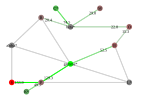

Total energy losses will be 29.406237382117624 kWh.
Total dirty energy used will be 277.2314729058804 kWh.
------Solution------
Punishment: 0.01
Total energy losses will be 29.406237382117624 kWh.
Total dirty energy used will be 277.2314729058804 kWh.
------Solution------
Punishment: 0.02
--- Flow changed on Day 4! ---


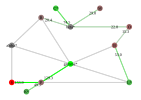

Total energy losses will be 30.96393654324943 kWh.
Total dirty energy used will be 129.250052598359 kWh.
------Solution------
Punishment: 0.03
Total energy losses will be 30.96393654324943 kWh.
Total dirty energy used will be 129.250052598359 kWh.
------Solution------
Punishment: 0.04
--- Flow changed on Day 4! ---


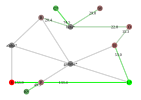

Total energy losses will be 35.08893822192046 kWh.
Total dirty energy used will be 0.0 kWh.
------Solution------
Punishment: 0.05
Total energy losses will be 35.08893822192046 kWh.
Total dirty energy used will be 0.0 kWh.


In [7]:
# trade-off parameter for using gamma
punishment = [0:0.01:0.05;];

# Model with Main Grid
using Clp, JuMP

m = Model(solver=ClpSolver())

@variable(m, x[arcs, days] >= 0) # energy flow from node i to j

# # useful expressions
@expression(m, flow_in_lossless[k in nodes, t in days], 
    sum(x[(i,j), t] for (i,j) in arcs if j == k))
@expression(m, flow_in[k in nodes, t in days], 
    sum((1-resistance*distance[(i,j)])*x[(i,j), t] for (i,j) in arcs if j == k))
@expression(m, flow_out[k in nodes, t in days], 
    sum(x[(i,j), t] for (i,j) in arcs if i == k))
@expression(m, energy_lost, sum(resistance*distance[a]*x[a, t] for a in arcs for t in days))
@expression(m, dirty_power, sum(flow_out[:gamma, t] for t in days))
                                
@constraint(m, power_balance[k in nodes, t in days], flow_out[k, t] - flow_in[k, t] <= supply[k, t] - demand[k, t])
Ppath = []; Bpath = [];

# track changes in loss as trade-off changes
dirt = -1
for p in punishment                                                
@objective(m, Min, energy_lost + p*dirty_power)
                                                
status = solve(m)

println("------Solution------")
println("Punishment: ", p)                                                                    
                                                                    
temp = getvalue(energy_lost)
if abs(dirt-temp) >= 0.01
    dirt = temp
    println("--- Flow changed on Day 4! ---")
    flow = Dict(zip(arcs, [getvalue(x[a, 4]) for a in arcs]))
    sleep(0.1)
    plot_flow(flow)
end

println("Total energy losses will be ", temp, " kWh.")
println("Total dirty energy used will be ", getvalue(dirty_power), " kWh.")
append!(Ppath, getvalue(x[(:gamma, :P), 4]))
append!(Bpath, getvalue(x[(:gamma, :B), 4]))
end

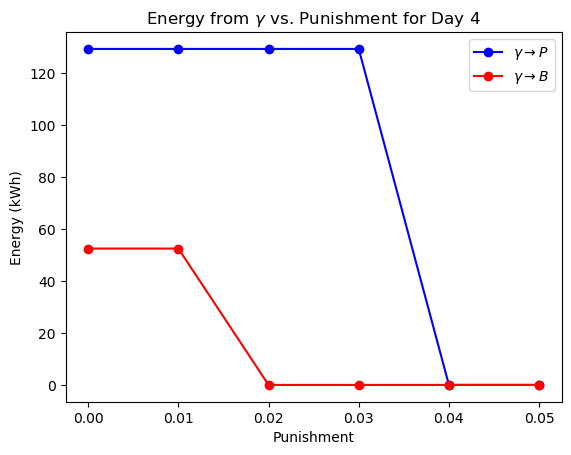

In [8]:
using PyPlot

title(L"Energy from $\gamma$ vs. Punishment for Day 4")
plot(punishment, Ppath, "b-o")
plot(punishment, Bpath, "ro-")
xlabel("Punishment")
ylabel("Energy (kWh)")
legend([L"$\gamma\rightarrow P$", L"$\gamma\rightarrow B$"]);

### 3.3 Battery Case

In this case, batteries with finite energy capacities were added to each consumer. The time-window was extended to a week, and data for supply and demand generated. Day 6 was used to act as a 'dead' day where neither the wind-power or solar-power sources were productive. Tony Stark's household was set to have a very high capacity, such that an opportunity arises where he could supply the village power instead of $\gamma$ on the dead day. The data (including capacities) is below.

In [9]:
days = [1:7;]

# using more compact array generation
matrix = zeros(length(nodes), length(days))
demand = NamedArray(matrix, (nodes, days), ("Consumer","Day"))
demand[:S, :] = [40.8, 100, 230.5, 150.8, 74.2, 97.3, 65.4]
demand[:P, :] = [37.8, 30.3, 28.8, 20.5, 37, 45, 29.6]
demand[:K, :] = repeat([27.3], length(days));
demand[:L, :] = [30.1, 28.8, 27.3, 55.2, 64, 42, 36.6]
demand[:C, :] = [30, 35.5, 31.2, 45.5, 50, 43.1, 38.4]
demand[:B, :] = [30.1, 31.5, 30.1, 35.1, 34.3, 39, 33.2]
demand[:O, :] = [23.7, 28.3, 16.4, 36.7, 20, 17.3, 11.1]
demand[:M, :] = [27.3, 21.9, 24.6, 28.9, 26, 30.7, 23.8]
demand[:R, :] = [19.2, 20.5, 20.5, 20, 18.4, 21.3, 20.5]

# note: day 4 and 6 are no-wind days, with low power supply on day 6.
matrix = zeros(length(nodes), length(days))
supply = NamedArray(matrix, (nodes, days), ("Producer","Day"))
supply[:alpha, :] = [600, 300, 700, 0, 100, 0, 350]
supply[:beta, :] = [500, 200, 900, 0, 50, 0, 300]
supply[:L, :] = [150, 200, 150, 305, 200, 30, 500]
supply[:K, :] = [200, 150, 100, 600, 150, 40, 200]
supply[:C, :] = [150, 230, 180, 120, 40, 20, 140]
supply[:gamma, :] .= 10000;

# battery capacities
cap = Dict(zip(nodes, zeros(length(nodes))))
for c in consumers
    cap[c] = 20;
end
cap[:S] = 100; # note that Stark has hyper-advanced battery technology

# battery efficiency
eff_in = 0.6;
eff_out = 0.8;

The variable $s_{k,t}$ was added to the model for the energy stored in the battery on node $k$ at the start of day $t$. The power balance constraint was modified to include this variable, including input and output efficiencies. Then the model was solved for a low vs. high value for Stark's battery capacity.

======Low Capacity Solution======
Total energy losses will be 344.53499733986206 kWh.
Total dirty energy used will be 97.60112304598438 kWh.
Stark can store 100.0 kWh.
------ Day 1 ------


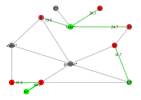

------ Day 2 ------


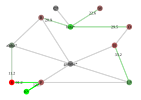

------ Day 3 ------


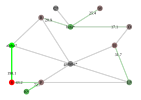

------ Day 4 ------


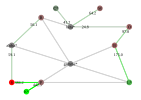

------ Day 5 ------


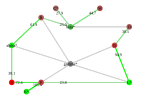

S stored 100.0 kWh on day 5.
K stored 20.0 kWh on day 5.
P stored 20.0 kWh on day 5.
L stored 20.0 kWh on day 5.
B stored 20.0 kWh on day 5.
O stored 20.0 kWh on day 5.
C stored 20.0 kWh on day 5.
M stored 20.0 kWh on day 5.
R stored 20.0 kWh on day 5.
------ Day 6 ------


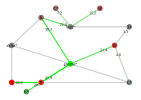

S stored 67.7688396271792 kWh on day 6.
K stored 20.0 kWh on day 6.
P stored 20.0 kWh on day 6.
L stored 20.0 kWh on day 6.
B stored 20.0 kWh on day 6.
O stored 20.0 kWh on day 6.
C stored 20.0 kWh on day 6.
M stored 20.0 kWh on day 6.
R stored 20.0 kWh on day 6.
------ Day 7 ------


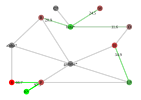

======High Capacity Solution======
Total energy losses will be 756.3589812311972 kWh.
Total dirty energy used will be 0.0 kWh.
Stark can store 1000.0 kWh.
------ Day 1 ------


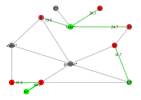

------ Day 2 ------


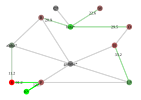

------ Day 3 ------


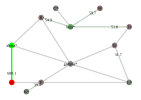

------ Day 4 ------


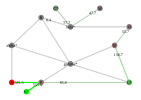

S stored 254.50721590024926 kWh on day 4.
K stored 20.0 kWh on day 4.
P stored 6.103799999999999 kWh on day 4.
O stored 20.0 kWh on day 4.
C stored 20.0 kWh on day 4.
M stored 20.0 kWh on day 4.
R stored 20.0 kWh on day 4.
------ Day 5 ------


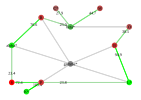

S stored 373.6115119985657 kWh on day 5.
K stored 20.0 kWh on day 5.
P stored 20.0 kWh on day 5.
L stored 20.0 kWh on day 5.
B stored 20.0 kWh on day 5.
O stored 20.0 kWh on day 5.
C stored 20.0 kWh on day 5.
M stored 20.0 kWh on day 5.
R stored 2.5157406185566957 kWh on day 5.
------ Day 6 ------


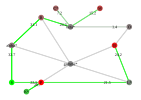

S stored 190.7099208833979 kWh on day 6.
K stored 20.0 kWh on day 6.
P stored 20.0 kWh on day 6.
L stored 20.0 kWh on day 6.
B stored 20.0 kWh on day 6.
O stored 20.0 kWh on day 6.
C stored 20.0 kWh on day 6.
M stored 20.0 kWh on day 6.
R stored 20.0 kWh on day 6.
------ Day 7 ------


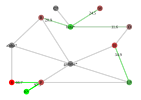

In [10]:
# Model
using Clp, JuMP

# dirty power penalty
penalty = 10;

Stark_cap = [100, 1000];

for s_cap in Stark_cap 

cap[:S] = s_cap
    
m = Model(solver=ClpSolver())

@variable(m, x[arcs, days] >= 0) # energy flow from node i to j
# energy stored in battery at node i on day t
@variable(m, s[nodes, 1:days[end]+1] >= 0) # the extra day is for compatibility with the power balance constraint

# # useful expressions
@expression(m, flow_in_lossless[k in nodes, t in days], 
    sum(x[(i,j), t] for (i,j) in arcs if j == k))
@expression(m, flow_in[k in nodes, t in days], 
    sum((1-resistance*distance[(i,j)])*x[(i,j), t] for (i,j) in arcs if j == k))
@expression(m, flow_out[k in nodes, t in days], 
    sum(x[(i,j), t] for (i,j) in arcs if i == k))
@expression(m, energy_lost, sum(resistance*distance[a]*x[a, t] for a in arcs for t in days) 
    + (1-eff_in*eff_out)*sum(s[k, t] for k in nodes for t in 1:days[end]+1)) # includes battery losses
@expression(m, dirty_power, sum(flow_out[:gamma, t] for t in days))
@expression(m, net_outflow[k in nodes, t in days], flow_out[k, t] - flow_in[k, t])
                                
# modified power balance to include batteries
@constraint(m, power_balance[k in nodes, t in days], net_outflow[k, t] 
    + s[k, t+1]/eff_in - eff_out*s[k, t] <= supply[k, t] - demand[k,t])
@constraint(m, starting_battery_savings[k in nodes], s[k, days[1]] == 0) # prevents needless storage
@constraint(m, battery_capacity[k in nodes, t in 1:days[end]+1], s[k, t] <= cap[k]) # battery capacity constraint
                                                                
@objective(m, Min, energy_lost + penalty*dirty_power)
                                                                                
status = solve(m)

println("======", (s_cap == Stark_cap[1] ? "Low" : "High"), " Capacity Solution======")
println("Total energy losses will be ", getvalue(energy_lost), " kWh.")
println("Total dirty energy used will be ", getvalue(dirty_power), " kWh.")
println("Stark can store ", cap[:S], " kWh.")
storage = getvalue(s)
for day in days
    flow = Dict(zip(arcs, [getvalue(x[a, day]) for a in arcs]))
    println("------ Day ", day, " ------")
    sleep(0.5)
    plot_flow(flow)
    for k in nodes
        if storage[k, day] > 0
            println(k, " stored ", storage[k, day], " kWh on day ", day, ".")
        end
    end
end
end

### 3.4 Sharing Case

In the battery model, nodes with large batteries (e.g. Stark) only shared energy if there was a shortage of supply from the network (not including $\gamma$) and if the punishment for using $\gamma$ was high enough to de-incentivize it.

#### 3.4.1 Incentivizing Revenue
To increase the amount of sharing, a negative term that represents total producers' contribution to the village (except for $\gamma$) is added to the objective function, with a 'price' trade-off parameter to reward production, so that the model maximizes revenue generated by producers.

------Solution------
Total energy losses will be 522.9905418929446 kWh.
Total dirty energy used will be 97.83642092569823 kWh.
Revenue: $7031.0
------ Day 1 ------


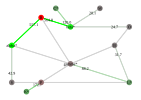

P received 133.17299999999997 kWh of excess energy on day 1.
gamma received 83.805 kWh of excess energy on day 1.
R received 1063.4728067010308 kWh of excess energy on day 1.
------ Day 2 ------


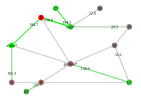

P received 91.173 kWh of excess energy on day 2.
gamma received 131.14 kWh of excess energy on day 2.
R received 496.2824434707904 kWh of excess energy on day 2.
------ Day 3 ------


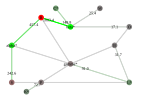

P received 43.17300000000001 kWh of excess energy on day 3.
gamma received 86.465 kWh of excess energy on day 3.
R received 1397.3122450859107 kWh of excess energy on day 3.
------ Day 4 ------


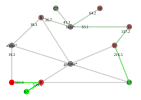

S received 66.6666666666667 kWh of excess energy on day 4.
P received 149.9168301060767 kWh of excess energy on day 4.
B received 13.33333333333336 kWh of excess energy on day 4.
O received 13.333333333333325 kWh of excess energy on day 4.
M received 13.333333333333341 kWh of excess energy on day 4.
R received 13.333333333333332 kWh of excess energy on day 4.
------ Day 5 ------


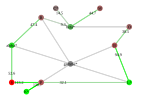

S stored 100.0 kWh on day 5.
K stored 20.0 kWh on day 5.
P stored 20.0 kWh on day 5.
L stored 20.0 kWh on day 5.
B stored 20.0 kWh on day 5.
O stored 20.0 kWh on day 5.
C stored 20.0 kWh on day 5.
M stored 20.0 kWh on day 5.
R stored 20.0 kWh on day 5.
------ Day 6 ------


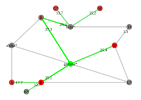

S stored 100.0 kWh on day 6.
P stored 20.0 kWh on day 6.
L stored 15.0 kWh on day 6.
B stored 20.0 kWh on day 6.
O stored 20.0 kWh on day 6.
C stored 12.104397577942914 kWh on day 6.
M stored 20.0 kWh on day 6.
R stored 20.0 kWh on day 6.
------ Day 7 ------


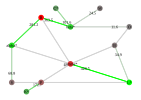

P received 141.373 kWh of excess energy on day 7.
gamma received 407.03000000000003 kWh of excess energy on day 7.
R received 602.8000291752577 kWh of excess energy on day 7.


In [11]:
# Model
using Clp, JuMP

# dirty power penalty
penalty = 10;

# price trade-off parameter
price = 1;

# reset Stark's capacity
cap[:S] = 100;
    
m = Model(solver=ClpSolver())

@variable(m, x[arcs, days] >= 0) # energy flow from node i to j
# energy stored in battery at node i on day t
@variable(m, s[nodes, 1:days[end]+1] >= 0) # the extra day is for compatibility with the power balance constraint

# # useful expressions
@expression(m, flow_in_lossless[k in nodes, t in days], 
    sum(x[(i,j), t] for (i,j) in arcs if j == k))
@expression(m, flow_in[k in nodes, t in days], 
    sum((1-resistance*distance[(i,j)])*x[(i,j), t] for (i,j) in arcs if j == k))
@expression(m, flow_out[k in nodes, t in days], 
    sum(x[(i,j), t] for (i,j) in arcs if i == k))
@expression(m, energy_lost, sum(resistance*distance[a]*x[a, t] for a in arcs for t in days) 
    + (1-eff_in*eff_out)*sum(s[k, t] for k in nodes for t in 1:days[end]+1)) # includes battery losses
@expression(m, dirty_power, sum(flow_out[:gamma, t] for t in days))
@expression(m, net_outflow[k in nodes, t in days], flow_out[k, t] - flow_in[k, t])
@expression(m, production, sum(net_outflow[k, t] for k in producers, t in days if k != :gamma))
                                
# modified power balance to include batteries
@constraint(m, power_balance[k in nodes, t in days], net_outflow[k, t] 
    + s[k, t+1]/eff_in - eff_out*s[k, t] <= supply[k, t] - demand[k,t])
@constraint(m, starting_battery_savings[k in nodes], s[k, days[1]] == 0) # prevents needless storage
@constraint(m, battery_capacity[k in nodes, t in 1:days[end]+1], s[k, t] <= cap[k]) # battery capacity constraint
                                                                
@objective(m, Min, energy_lost + penalty*dirty_power - price*production)
                                                                                
status = solve(m)

println("------Solution------")
println("Total energy losses will be ", getvalue(energy_lost), " kWh.")
println("Total dirty energy used will be ", getvalue(dirty_power), " kWh.")
println("Revenue: \$", round(getvalue(price*production)))
storage = getvalue(s)

for day in days
    flow = Dict(zip(arcs, [getvalue(x[a, day]) for a in arcs]))
    println("------ Day ", day, " ------")
    sleep(0.5)
    plot_flow(flow)
    for k in nodes
        if storage[k, day] > 0
            println(k, " stored ", storage[k, day], " kWh on day ", day, ".")
        end
        needed = getvalue(demand[k,day] + s[k,day+1])
        extra = getvalue(-net_outflow[k, day] - needed)
        if extra > 1
            println(k, " received ", extra, " kWh of excess energy on day ", day, ".")
        end
    end
end

#### 3.4.2 Sufficiency Constraint
The new production term resulted in a situation where producers would 'overshare' their spoils, overwhelming consumers with energy far above their needs. To counter this, a _sufficiency_ constraint was added to the model, which ensured that the energy being received by a node was limited by how much was needed.

------Solution------
Total energy losses will be 315.3704551886344 kWh.
Total dirty energy used will be 240.27990281226823 kWh.
Revenue: $1742.0
------ Day 1 ------


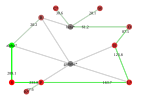

------ Day 2 ------


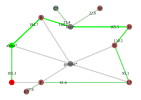

------ Day 3 ------


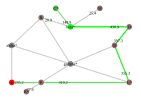

------ Day 4 ------


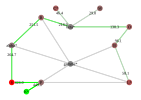

------ Day 5 ------


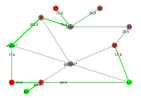

------ Day 6 ------


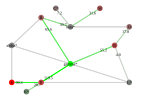

K stored 20.0 kWh on day 6.
L stored 20.0 kWh on day 6.
C stored 20.0 kWh on day 6.
------ Day 7 ------


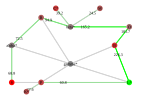

In [12]:
@constraint(m, sufficiency[k in nodes, t in days], -net_outflow[k, t] <= demand[k, t] + s[k, t]/eff_in)

status = solve(m)

println("------Solution------")
println("Total energy losses will be ", getvalue(energy_lost), " kWh.")
println("Total dirty energy used will be ", getvalue(dirty_power), " kWh.")
println("Revenue: \$", round(getvalue(price*production)))
storage = getvalue(s)

for day in days
    flow = Dict(zip(arcs, [getvalue(x[a, day]) for a in arcs]))
    println("------ Day ", day, " ------")
    sleep(0.5)
    plot_flow(flow)
    for k in nodes
        if storage[k, day] > 0
            println(k, " stored ", storage[k, day], " kWh on day ", day, ".")
        end
        needed = getvalue(demand[k,day] + s[k,day+1])
        extra = getvalue(-net_outflow[k, day] - needed)
        if extra > 1
            println(k, " received ", extra, " kWh of excess energy on day ", day, ".")
        end
    end
end

### 3.5 No-Cycles Case

In the [Sharing Case](#3.4-Sharing-Case), the amount of revenue was controlled by a `price` trade-off parameter. As the price became large, the sharing became problematic, leading to back-and-forth cycles between certain nodes. We can see this below as the `price` increases from 1 to 2.

------Solution for price=1------
Total energy losses will be 292.57233577318505 kWh.
Total dirty energy used will be 240.27990281226823 kWh.
No Cycles Detected!
------Solution for price=2------
Total energy losses will be 5627.279902812267 kWh.
Total dirty energy used will be 240.27990281226965 kWh.
--- Day 1 ---


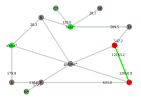

Cycle between L and B.
--- Day 2 ---


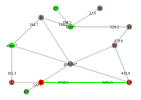

Cycle between P and L.
--- Day 3 ---


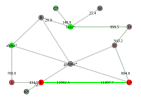

Cycle between P and L.
--- Day 4 ---


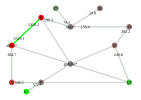

Cycle between alpha and R.
--- Day 5 ---


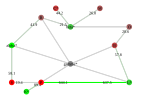

Cycle between P and L.
--- Day 7 ---


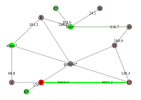

Cycle between P and L.


In [13]:
# Model
using Clp, JuMP

# dirty power penalty
penalty = 10;

# price trade-off parameter
price = [1:2...];

for p in price
    
m = Model(solver=ClpSolver())

@variable(m, x[arcs, days] >= 0) # energy flow from node i to j
# energy stored in battery at node i on day t
@variable(m, s[nodes, 1:days[end]+1] >= 0) # the extra day is for compatibility with the power balance constraint

# # useful expressions
@expression(m, flow_in_lossless[k in nodes, t in days], 
    sum(x[(i,j), t] for (i,j) in arcs if j == k))
@expression(m, flow_in[k in nodes, t in days], 
    sum((1-resistance*distance[(i,j)])*x[(i,j), t] for (i,j) in arcs if j == k))
@expression(m, flow_out[k in nodes, t in days], 
    sum(x[(i,j), t] for (i,j) in arcs if i == k))
@expression(m, energy_lost, sum(resistance*distance[a]*x[a, t] for a in arcs for t in days) 
    + (1-eff_in*eff_out)*sum(s[k, t] for k in nodes for t in 1:days[end]+1)) # includes battery losses
@expression(m, dirty_power, sum(flow_out[:gamma, t] for t in days))
@expression(m, net_outflow[k in nodes, t in days], flow_out[k, t] - flow_in[k, t])
@expression(m, production, sum(net_outflow[k, t] for k in producers, t in days if k != :gamma))
                                
# modified power balance to include batteries
@constraint(m, power_balance[k in nodes, t in days], net_outflow[k, t] 
    + s[k, t+1]/eff_in - eff_out*s[k, t] <= supply[k, t] - demand[k,t])
@constraint(m, starting_battery_savings[k in nodes], s[k, days[1]] == 0) # prevents needless storage
@constraint(m, battery_capacity[k in nodes, t in 1:days[end]+1], s[k, t] <= cap[k]) # battery capacity constraint
@constraint(m, sufficiency[k in nodes, t in days], -net_outflow[k, t] <= demand[k, t] + s[k, t]) # sufficiency constraint

                                                                                                
@objective(m, Min, energy_lost + penalty*dirty_power - p*production)
                                                                                
status = solve(m)

println("------Solution for price=", p, "------")
println("Total energy losses will be ", getvalue(energy_lost), " kWh.")
println("Total dirty energy used will be ", getvalue(dirty_power), " kWh.")
X = getvalue(x)
storage = getvalue(s)

cycles_count = []
for day in days
# a list of bidirectional cycles
cycles = NamedArray([(X[(i,j),day]*X[(j,i),day] > 0 ? 1 : 0) for (i,j) in oneway_arcs], (oneway_arcs,))
    if sum(cycles) > 0
        println("--- Day ", day, " ---")
        flow = Dict(zip(arcs, [X[a, day] for a in arcs]))
        sleep(0.2)
        plot_flow(flow)
        for (i,j) in oneway_arcs
        if cycles[(i,j)] > 0
            println("Cycle between ", i, " and ", j, ".")
        end
        end
        sleep(0.2)
    end
append!(cycles_count, cycles)
end
if sum(cycles_count) == 0
println("No Cycles Detected!")                                                                                                    
end
                                                                                                    
end

#### 3.5.1 No-Cycles Trade-off Solution
The cycles from an increased price were eliminated by adding the constraint:

$x_{ij,t} + x_{ji,t} = \max{(x_{ij,t}, x_{ji,t})}$

This was implemented in our model using an epigraph variable $y_{ij, t}$ which acted as a flow-cap along the arc $(i,j)$. The variable was mirrored so that it would be equal in both directions for the arc, i.e. $y_{ij,t} = y_{ji, t}$. A term that equated to the sum of the flow caps was added to the objective function, with a `cp` trade-off multiplier. Finally, a constraint was added so that each flow was properly capped: $x_{ij,t} \leq y_{ij, t}$. Minimizing this term enforced $y$ to be the maximum of the arc's flows in each direction. This resulted in a cycle-free solution, as long as `cp` was large enough.

------Solution for cp=0.0------
Total energy losses will be 5627.279902812267 kWh.
Total dirty energy used will be 240.27990281226965 kWh.
Revenue: $14108.0
Cycles: 6
------Solution for cp=0.01------
Total energy losses will be 5627.2799028122645 kWh.
Total dirty energy used will be 240.2799028122679 kWh.
Revenue: $14108.0
Cycles: 6
------Solution for cp=0.02------
Total energy losses will be 5627.2799028122645 kWh.
Total dirty energy used will be 240.2799028122679 kWh.
Revenue: $14108.0
Cycles: 6
------Solution for cp=0.03------
Total energy losses will be 130.19639942732366 kWh.
Total dirty energy used will be 240.2799028122682 kWh.
Revenue: $3114.0
Cycles: 0
------Solution for cp=0.04------
Total energy losses will be 130.19639942732366 kWh.
Total dirty energy used will be 240.2799028122682 kWh.
Revenue: $3114.0
Cycles: 0
------Solution for cp=0.05------
Total energy losses will be 130.19639942732366 kWh.
Total dirty energy used will be 240.2799028122682 kWh.
Revenue: $3114.0
Cycles

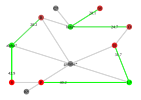

--- Day 2 ---


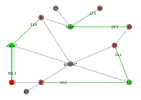

--- Day 3 ---


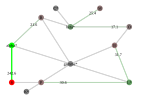

--- Day 4 ---


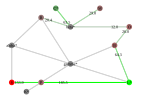

--- Day 5 ---


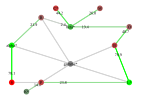

--- Day 6 ---


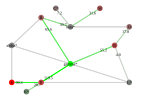

--- Day 7 ---


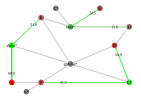

In [14]:
# Model
using Clp, JuMP

# dirty power penalty
penalty = 10;

# price trade-off parameter that creates cycles
price = 2;
    
m = Model(solver=ClpSolver())

@variable(m, x[arcs, days] >= 0) # energy flow from node i to j
# energy stored in battery at node i on day t
@variable(m, s[nodes, 1:days[end]+1] >= 0) # the extra day is for compatibility with the power balance constraint
@variable(m, y[arcs, days] >= 0) # cap for flow along arc (i, j)

# # useful expressions
@expression(m, flow_in_lossless[k in nodes, t in days], 
    sum(x[(i,j), t] for (i,j) in arcs if j == k))
@expression(m, flow_in[k in nodes, t in days], 
    sum((1-resistance*distance[(i,j)])*x[(i,j), t] for (i,j) in arcs if j == k))
@expression(m, flow_out[k in nodes, t in days], 
    sum(x[(i,j), t] for (i,j) in arcs if i == k))
@expression(m, energy_lost, sum(resistance*distance[a]*x[a, t] for a in arcs for t in days) 
    + (1-eff_in*eff_out)*sum(s[k, t] for k in nodes for t in 1:days[end]+1)) # includes battery losses
@expression(m, dirty_power, sum(flow_out[:gamma, t] for t in days))
@expression(m, net_outflow[k in nodes, t in days], flow_out[k, t] - flow_in[k, t])
@expression(m, production, sum(net_outflow[k, t] for k in producers, t in days if k != :gamma))
@expression(m, cycleflow, sum(y)) # sum of flowcaps
                                                                                            
# modified power balance to include batteries
@constraint(m, power_balance[k in nodes, t in days], net_outflow[k, t] 
    + s[k, t+1]/eff_in - eff_out*s[k, t] <= supply[k, t] - demand[k,t])
@constraint(m, starting_battery_savings[k in nodes], s[k, days[1]] == 0) # prevents needless storage
@constraint(m, battery_capacity[k in nodes, t in 1:days[end]+1], s[k, t] <= cap[k]) # battery capacity constraint
@constraint(m, sufficiency[k in nodes, t in days], -net_outflow[k, t] <= demand[k, t] + s[k, t]) # sufficiency constraint

# cycle breaking constraints
@constraint(m, cyclebreaker[(i,j) in oneway_arcs, t in days], x[(i,j),t] + x[(j,i),t] == y[(i,j), t])                                                                                                                                        
@constraint(m, symmetry[(i,j) in oneway_arcs, t in days], y[(i,j), t] == y[(j,i), t])                                                                                            
@constraint(m, limit_flow[a in arcs, t in days], x[a,t] <= y[a,t])

# cycle vector for plotting
                                                                                            
# adjust cycle prevention coefficient
for cp in 0:0.01:0.05
                                                                                                
@objective(m, Min, energy_lost + penalty*dirty_power - price*production + cp*cycleflow)
                                                
status = solve(m)
                                                                                                
println("------Solution for cp=", cp, "------")
println("Total energy losses will be ", getvalue(energy_lost), " kWh.")
println("Total dirty energy used will be ", getvalue(dirty_power), " kWh.")
println("Revenue: \$", round(getvalue(price*production)))
X = getvalue(x)
cycles = sum([(X[(i,j),day]*X[(j,i),day] > 0 ? 1 : 0) for (i,j) in oneway_arcs for day in days])
println("Cycles: ", cycles)                                                                                    
end   

println("====== No-Cycle Solution ======")
println("cp=", 0.05)                                                                                                            
for day in days
flow = Dict(zip(arcs, [getvalue(x[a, day]) for a in arcs]))
println("--- Day ", day, " ---")
sleep(0.2)
plot_flow(flow)                                                                                                                
end
                                                                                                            

### 3.6 Random Case

#### 3.6.1 Functionized Model
To ease analysis, the model was put into a function where the trade-off parameters for `price`, `penalty`, `cp`, and added a trade-off for energy losses, `cost`. This function will be used extensively in this section. Other parameters relate to random model generation, discussed in the subsequent sections.

The code for the function can be found in the [Appendix](#Functionized-Model).

#### 3.6.2 Realistic Data
It was discovered that the supply values for solar panels used in this project earlier were extreme over-estimates, by a factor of 100! This was due to human error. Solar supply was fixed to more realistic numbers.

In [15]:
# More realistic solar supply data
supply[:L, :] = [150, 200, 150, 305, 200, 30, 500]*6/100;
supply[:K, :] = [200, 150, 100, 600, 150, 40, 200]*6/100;
supply[:C, :] = [150, 230, 180, 120, 40, 20, 140]*6/100;

# battery capacities
cap = Dict(zip(nodes, zeros(length(nodes))))
for c in consumers
    cap[c] = 20;
end
cap[:S] = 100;

The model function was then run to see the more 'realistic' solution:

.
====== Realistic Solution ======
--- Day 1 ---


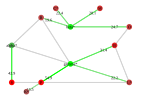

C stored 0.6 kWh in batteries.

--- Day 2 ---


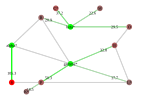

C stored 9.1 kWh in batteries.

--- Day 3 ---


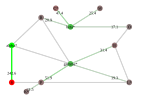

C stored 20.0 kWh in batteries.

--- Day 4 ---


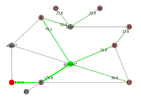

K stored 5.2 kWh in batteries.

--- Day 5 ---


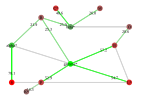


--- Day 6 ---


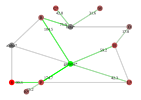


--- Day 7 ---


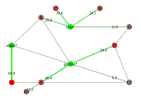

In [16]:
data = solve_flows(verbose=false)

println("====== Realistic Solution ======")
for day in days
    println("--- Day ", day, " ---")
    sleep(0.1)
    plot_flow(data["flows"][:, day])
    for k in nodes
    if data["storage"][k, day] > 0
        println(k, " stored ", round(data["storage"][k, day], 1), " kWh in batteries.")
    end
    end
    println()
end

#### 3.6.3 Random Uniform Data

To test the robustness of the model, random data was generated for supply and demand. The option to specify the days without wind or sun was also included.

The supply $p_{k, t}$ and/or demand $c_{k, t}$ for node $k$ and day $t$ is a uniform random variable between 0 and a set maximum value.

Supply: $p_{k,t} \sim \text{unif}(0, P_k)\ \forall\ k \in N,\ t \in T$

Demand: $c_{k,t} \sim \text{unif}(0, C_k)\ \forall\ k \in N,\ t \in T$

The default set-values are: 
- if $k$ is a wind-turbine, $P_k = 500, C_k = 0$
- if $k$ is a solar household, $P_k = 5, C_k = 60$
- if $k$ is a regular household, $P_k = 0, C_k = 60$
- if $k$ is Stark, $P_k = 0, C_k = 250$

Below, the use of randomly generated uniform demand and supply is illustrated. 3 sunless days and 1 windless day are randomly chosen from the set of days.

Seed: 514220
No wind days: [2]
No sun days: [2, 5, 6]
Randomized supply: 12×7 Named Array{Float64,2}
Nodes ╲ Day │       1        2        3        4        5        6        7
────────────┼──────────────────────────────────────────────────────────────
:S          │     0.0      0.0      0.0      0.0      0.0      0.0      0.0
:K          │ 2.33937      0.0  3.04618  1.84783      0.0      0.0  3.45215
:P          │     0.0      0.0      0.0      0.0      0.0      0.0      0.0
:gamma      │ 10000.0  10000.0  10000.0  10000.0  10000.0  10000.0  10000.0
:L          │ 2.79351      0.0  2.20741  3.41902      0.0      0.0  4.23781
:B          │     0.0      0.0      0.0      0.0      0.0      0.0      0.0
:O          │     0.0      0.0      0.0      0.0      0.0      0.0      0.0
:beta       │ 478.736      0.0  201.489  269.685  391.763  410.602  318.431
:C          │ 4.89164      0.0  3.39426  1.93294      0.0      0.0   2.6399
:M          │     0.0      0.0      0.0      0.0      0.0      

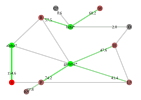

C stored 2.9 kWh in batteries.

--- Day 2 ---


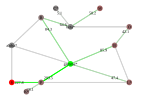


--- Day 3 ---


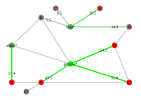

K stored 1.7 kWh in batteries.

--- Day 4 ---


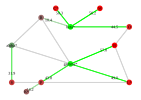


--- Day 5 ---


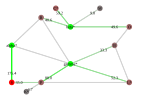


--- Day 6 ---


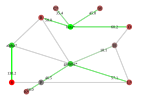


--- Day 7 ---


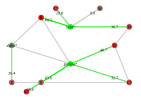

In [17]:
data = solve_flows(random_supply = true, random_demand = true, no_wind = 1, random_dist = :Uniform,
    no_sun = 3, verbose=false)

println("====== Randomized Uniform Solution ======")
for day in days
    println("--- Day ", day, " ---")
    sleep(0.1)
    plot_flow(data["flows"][:, day])
    for k in nodes
    if data["storage"][k, day] > 0
        println(k, " stored ", round(data["storage"][k, day], 1), " kWh in batteries.")
    end
    end
    println()
end

### 3.6.4 Random Gaussian Data

Similarly to the [Random Uniform Data](#3.6.3-Random-Uniform-Data) case, a model which generates random supply and/or demand according to a normal distribution was implemented. This models more realistic wind and sun patterns. The distribution was controlled by the mean value $P_k$ and percentage range $\sigma$ (which could be customized).

Supply: $p_{k,t} = \sigma P_k X + P_k \ \text{where } X \sim \mathcal{N}(0,1)$

Demand: $c_{k,t} = \sigma C_k X + C_k \ \text{where } X \sim \mathcal{N}(0,1)$

The set default values were:
- if $k$ is a wind-turbine, $P_k = 350, C_k = 0$
- if $k$ is a solar household, $P_k = 3, C_k = 40$
- if $k$ is a regular household, $P_k = 0, C_k = 40$
- if $k$ is Stark $P_k = 0, C_k = 150$

This generation is illustrated below. Again, 3 no-sun days and 1 no-wind day are randomly generated.

Seed: 513969
No wind days: [2]
No sun days: [1, 2, 7]
Randomized supply: 12×7 Named Array{Float64,2}
Nodes ╲ Day │       1        2        3        4        5        6        7
────────────┼──────────────────────────────────────────────────────────────
:S          │     0.0      0.0      0.0      0.0      0.0      0.0      0.0
:K          │     0.0      0.0  2.69993  4.38016  2.79436  3.95808      0.0
:P          │     0.0      0.0      0.0      0.0      0.0      0.0      0.0
:gamma      │ 10000.0  10000.0  10000.0  10000.0  10000.0  10000.0  10000.0
:L          │     0.0      0.0  3.27552  2.30163  2.18592  2.30785      0.0
:B          │     0.0      0.0      0.0      0.0      0.0      0.0      0.0
:O          │     0.0      0.0      0.0      0.0      0.0      0.0      0.0
:beta       │ 167.127      0.0  290.513  298.425  456.015    305.0  441.767
:C          │     0.0      0.0  4.21493  1.72446  3.39955  3.32166      0.0
:M          │     0.0      0.0      0.0      0.0      0.0      

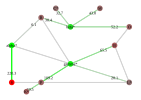


--- Day 2 ---


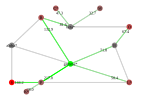


--- Day 3 ---


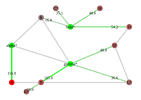


--- Day 4 ---


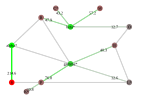


--- Day 5 ---


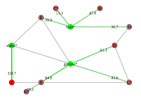


--- Day 6 ---


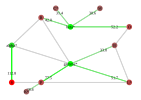


--- Day 7 ---


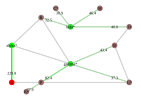

In [18]:
data = solve_flows(random_supply = true, random_demand = true, no_wind = 1, random_dist = :Gaussian,
    no_sun = 3, verbose=false)

println("====== Randomized Gaussian Solution ======")
for day in days
    println("--- Day ", day, " ---")
    sleep(0.1)
    plot_flow(data["flows"][:, day])
    for k in nodes
    if data["storage"][k, day] > 0
        println(k, " stored ", round(data["storage"][k, day], 1), " kWh in batteries.")
    end
    end
    println()
end

---

## 4. Results and Discussion ##

The different cases from the [Problem Statement](#1.2-Problem-Statement) are discussed:
- [Simplest Case](#4.1-Simplest-Case)
- [Main-Grid Case](#4.2-Main-Grid-Case)
- [Battery Case](#4.3-Battery-Case)
- [Sharing Case](#4.4-Sharing-Case)
- [No-Cycles Case](#4.5-No-Cycles-Case)
- [Random Case](#4.6-Random-Case)

### 4.1 Simplest Case

In this section, the [Simplest Case](#3.1-Simplest-Case) with the Equality Constraint vs. with the Inequality Constraint is discussed.

This simple model of the village focused on the Energy Balance and on meeting the Energy Demand.  There were no batteries, conventional power grids, or any incentives to share excess power.  The producers needed to supply power to meet all power demands.

In the [first attempt](#3.1.1-First-Attempt-Model), a power balance constraint was employed where, for node $k$ on day $t$, the net outflow of energy from the node was made to _equal_ the energy available in the node (supply of energy that node had - demand of energy that node needed).

The flow graphs in the [solution](#3.1.1-First-Attempt-Model) showed an extremely high energy flow. Moreover, each day had a cycle on an edge, which was not desired because flow should be only in 1 direction. With this strict equality constraint, individuals were looking to dump excess energy to meet the constraint that needed to be strictly met. The equality constraint had forced the producers to give out excess energy, even when there was no demand and this led to cycles and wastage. This resulted in single-edge cycles where energy flowed back and forth to meet the power balance constraint.   

To prevent these issues, the power balance constraint was changed from an equality Constraint to an inequality Constraint: the net outflow of energy $\leq$ (supply – demand). Changing the constraint from equality to an inequality reduces the energy flow till the point that the demand is exactly met. This inequality removed the cycles, as the graphs illustrate and the comparison table below highlights as well.  When there were cycles, there were several edges where energy was sent even though there was no need; when the cycles were removed (with this inequality constraint), those edges then had 0 flow. 

Below a Comparison Table of the Energy Flow from Wednesday to Friday across each of the 16 edges has been provided;  the flow with the Equality Constraint (with the cycles) was compared with the much more reasonable flow with the Inequality Constraint (which got rid of the cycles). 


| Edges  	|  Day of Week 	|   Equality Constraint (kWh Result with Cycles)	|   Inequality Constraint (kWh Result with No Cycles)	|  
|---    	|---	|---	|---	|
|  K, P 	| Wednesday  | 389,259.0 and 387,339.1| 71.1 |
|  P, S	| Wednesday  | 5,940.94 | 41.6 | 
|  S, $\alpha$ 	| Wednesday | 6296.5 | 0 | 
|  $\alpha$, R	| Wednesday | 5049.0 | 0 | 
|  R, beta	| Wednesday | 5171.6 | 19.6 | 
|  beta, O 	| Wednesday | 1311.6 | 14.3 | 
|  O, B 	| Wednesday | 1366.3 | 0 | 
|  B, L	| Wednesday | 1469.9 | 31.7 | 
|  L, P 	| Wednesday | 0 | 0 | 
|  P, $\gamma$ 	| Wednesday |0 | 0 | 
|  $\gamma$, $\alpha$	| Wednesday | 0 | 0 | 
|  $\gamma$, L 	| Wednesday | 0 | 0 | 
|  $\gamma$, B 	| Wednesday | 0| 0 | 
|  $\gamma$, R 	| Wednesday | 0 | 0 | 
|  $\beta$, C 	| Wednesday | 1,470 | 0 | 
|  $\beta$, M 	| Wednesday | 28.1 | 28.1 | 
| . | . |  . |. | 
|  K, P 	| Thursday  | 265,509.1 and 264,326.7 | 133.7 |
|  P, S	| Thursday  | 102 | 102 | 
|  S, $\alpha$ 	| Thursday | 0 | 0 | 
|  $\alpha$, R	| Thursday |2,296.2| 0 | 
|  R, $\beta$	| Thursday | 2,364.0 | 20.9 | 
|  $\beta$, O 	| Thursday | 42.5 | 8.6 | 
|  O, B 	| Thursday | 32.5 | 0 | 
|  B, L	| Thursday | 0 | 33.2 | 
|  L, P 	| Thursday | 4,210.6| 0 | 
|  P, $\gamma$ 	| Thursday | 0 | 0 | 
|  $\gamma$, $\alpha$	| Thursday | 2,481.4 | 0 | 
|  $\gamma$, L 	| Thursday | 2,357.3 | 0 | 
|  $\gamma$, B 	| Thursday | 0 | 0 | 
|  $\gamma$, R 	| Thursday | 0 | 0 | 
|  $\beta$, C 	| Thursday | 2,274.5 | 0 | 
|  $\beta$, M 	| Thursday | 22.6 | 22.6 | 
| . | . |  . |. | 
|  K, P 	| Friday  | 707,785.0 and 701,679.8 | 81.1 |
|  P, S	| Friday  | 6599.5 | 51.5 | 
|  S, $\alpha$ 	| Friday | 7000.0 | 0 | 
|  $\alpha$, R	| Friday | 0 | 0 | 
|  R, $\beta$	| Friday | 20.9 | 20.9 | 
|  $\beta$, O 	| Friday | 6687.1 | 17.1 | 
|  O, B 	| Friday | 6403.3 | 0 | 
|  B, L	| Friday | 0 | 31.7 | 
|  L, P 	| Friday | 7109.8 | 0 | 
|  P, $\gamma$ 	| Friday | 0 | 0 | 
|  $\gamma$, $\alpha$	| Friday | 0 | 0 | 
|  $\gamma$, L 	| Friday | 5933.8 | 0 | 
|  $\gamma$, B 	| Friday | 6181.1 | 0 | 
|  $\gamma$, R 	| Friday | 0 | 0 | 
|  $\beta$, C 	| Friday | 1768.8 | 0 | 
|  $\beta$, M 	| Friday | 25.4 | 25.4 | 

Flow Values that did NOT change with the changing of the constraint from an equality to an inequality:
* Wednesday only:  (L,P), ($\gamma$, L) had NO flow
* Thursday only:  (P, S) had the same original value (102.0 kWh);  (S, $\alpha$) had NO flow
* Friday only: ($\alpha$, R) had NO flow;  (R, $\beta$) had the same original value (20.9 kWh)
* Wednesday and Friday:  ($\gamma$, $alpha$) edge still had NO flow
* Wednesday and Thursday:  ($\gamma$, B), and ($\gamma$, R) had NO flow
* For all 3 days:  the ($\beta$, M) edge had the same original flow, (P, $\gamma$) had NO flow 

### 4.2 Main-Grid Case

In the [next case](#3.2-Main-Grid-Case), a connection to a conventional power grid was implemented via a node $\gamma$. This external grid could be sourced environmentally unfriendly resources (aka dirty power), but could supply any shortage that power producers could not meet. To make the power grid an sufficient source of energy, it was given a large supply of 100,000 kWh. However, to de-incentivize external power, a penalty is imposed for using this power from $\gamma$. This was done via a trade-off parameter, `punishment`.

Note that for different values of this punishment penalty parameter, the energy flow was impacted. The *Total Main-Grid Energy Used (in kWh)* measures the total amount of energy that is being supplied by the external grid ($\gamma$) on the 4th Day. Day 4 was chosen to illustrate the effects that altering the Punishment Parameter has on the solution (and any other day could have been chosen all the same). Here, this table below illustrates the changes in the Energy Flow in the village based on different punishment parameters for using the Main-Grid. The Punishment Parameters here are 0.01 to 0.05 (and for simplicity only these discrete values are considered).  

Please note that from the plots provided in the [3.2 Main Grid Case](#3.2-Main-Grid-Case) section, these were the Network Flow results for the Village based on different punishment parameter values:


| Punishment Value for Using 1 kWh of the Main-Grid  	|  Total Energy Loss 	|   Total Main-Grid Energy Used (in kWh)	|   Changes in Flow (on Day 4)	|  
|---    	|---	|---	| ---|
|  0.01	| 29.41  | 277.23 | None (same as for having NO punishment) |
|  0.02	| 30.964  | 129.25 | There is NO energy flow from $\gamma$ to B; instead B gets Energy from L. The energy flow remains the same along ($\gamma$, P). | 
|  0.03 	| 30.964 | 129.25 | None (same energy flow as that for Punishment of 0.02). | 
|  0.04	| 35.089 | None (0) | Punishment for using $\gamma$ is too high.  Now, $\gamma$ NO longer supplies any energy flow to the network. P now gets its energy from L.  Thus, L stepped up to supply energy to both B as well as to P now.  | 
|  0.05	| 35.089 | None (0)| None (same energy flow as that for Punishment of 0.04) | 

The table above indeed shows that Total Dirty Energy used falls drastically from 277.23 to 129.25 kWh when the punishment was increased (doubled) from 0.01 to 0.02. From a punishment parameter of 0.02 onwards, less and less dirty power is used in the village; a punishment parameter of 0.01 was still too low and had no impact on the energy flow and individuals still resorted to using the same dirty power as before because the benefits (reduction in energy loss) outweighted the cons (punishment). 

The "Energy from $\gamma$ vs. Punishment for Day 4" plot (in section [3.2 Main Grid Case](#3.2-Main-Grid-Case)) graphically displays this and shows the actual energy flow from $\gamma$ for a given punishment parameter from 0 to 0.05.  The punishment parameter of 0.01 has no impact and the solution and energy flow to both B and P remains the same.   When the Punishment Parameter is 0, $\gamma$ is supplying dirty energy to both P and B.  However, as the Punishment Parameter increases to 0.02, $\gamma$ supplies no energy to B.  This energy supply is cut off.  Finally, when the punishment is 0.04, $\gamma$ is turned off completely and NO more dirty energy is used.  

To compensate for using the expensive main-grid, the producers are more inclined to give away excess energy to meet shortages.  In the interest of minimizing the objective function, L steps up to provide energy to B and P to help them meet their demands. 

In conclusion, the `punishment` parameter is an effective trade-off control between energy loss and external power. A realistic balance needs to be found between efficiently meeting the energy requirements and looking out for the environment.


### 4.3 Discussion: Battery Case

*Please recall that S represents Tony Stark's Household*.

In this [case](#3.3-Battery-Case), batteries were given to all of the household nodes.  The punishment parameter was set to 10 to de-incentivize 'dirty' power. Each household had up to 20 kWh capacity (except for the Stark household (S), which had a large capacity. Stark’s capacity is:

*  Low Capacity Case:  Stark’s battery capacity is 100 kWh (which is 5 times as much as the capacity for other households).  
*  High Capacity Case: Stark’s battery capacity is 1,000 kWh (which is 10 times as much as his capacity in the Low Capacity case).  

Finally, the time-window was increased to 7 days, with a low-supply ('dead') day on Day 6. The model was finally solved.

Below, the battery usage is compared between the Low-Capacity and High-Capacity solutions:

| Day in the Village  	|  Low Capacity Battery Capacity Usage (in kWh) 	|   High Capacity Battery Capacity Usage (in kWh)|  
|---    	|---	|---	|
|  Day 3	| No Energy is being stored in any batteries.   | No Energy is being stored in any batteries. | 
|  Day 4	| No Energy is being stored in any batteries.   | S stores 254.51 kWh (around 25% of max capacity).   K, O, C, M, and R store 20 kWh (max capacity).  P stores 6.1 kWh. L and B do not store any battery capacity. | 
|  Day 5	| S stores 100 kWh (max capacity).   K, P, L, B, O, C, M,  and R store 20 kWh (max capacity).   | S stores 373.61 kWh (about 37% of max capacity).   K, P, L, B, O, C, and M,  store 20 kWh (max capacity). R stores 2.52 kWh, which is much lower than it did for the Low Capacity Solution. | 
|  Day 6 (Dead Day)	| S stores 67.76 kWh (about 2/3 of max capacity).   K, P, L, B, O, C, M, and R store 20 kWh (max capacity).   | S stores 190.71 kWh (about 19% of max capacity, and half as much as on Day 5).   K, P, L, B, O, C, M, and R store 20 kWh (max capacity). | 

The key variation is the capacity of Stark’s battery (which is explored in the Low and High Capacity cases). By increasing Stark’s capacity in the High Capacity case, Stark is able to store enough energy for the Dead Day and can contribute energy to the individuals who need it, thereby eliminating the need for any Dirty Energy to be used.

Across the 7 days, the Total Energy Losses in the village is approximately 344.535 kWh.  On the Dead Day for the Low Capacity Case, the $\gamma$ node is providing energy to $R$, $B$, and $P$. Thus, the Total Dirty Energy Used is 97.601 kWh, as illustrated by the plots in [Section 3.3: Battery Case](#3.3-Battery-Case). While the Total Energy Losses in the village increases from 344.535 kWh (in the Low Capacity Solution) to 756.360 kWh (in the High Capacity Solution), the Total Dirty Energy falls to 0.

The High Capacity Solution illustrates that higher battery capacities expand the possible options that individuals have to fulfill their shortages. They can choose to use Dirty Energy (and pay the penalty) or they can reach out to storage. Here, when Stark has the high battery capacity, the individuals in the village resort to using Stark’s battery capacity and do not use any dirty power. Having batteries slightly eases the demand that individuals have for energy because they can have some small back-up reserves (in the battery) for a dead day.  


###  4.4 Sharing Case
  
This [case](#3.4-Sharing-Case) explores how the energy flow in the Network is impacted when sharing is encouraged.  This is modelled with adding a production term with a trade-off parameter `price` that acts as a monetary reward (revenue) for individuals who have excess energy and share it with others. The `penalty` trade-off is set to 10 and Stark's capacity is set to 100. 

The table below summarizes the results of the model's first solution:

| Day  	|  Excess Energy Received (in kWh) 	|   Energy Stored for the Next Day (in kWh)	|  
|---    	|---	|---	|
|  1 	| P received 133.17 kWh, $\gamma$ received 83.81 kWh, and R received 1063.47 kWh of excess energy on Day 1.  | None | 
|  2 	| P received 91.173 kWh, $\gamma$ received 131.14 kWh, and R received 496.28 kWh of excess energy on Day 2. | None | 
|  3 	| P received 43.17 kWh, $\gamma$ received 86.465 kWh, and R received 1397.31 kWh of excess energy on Day 3. | None | 
|  4 	| S received 66.67 kWh and P received 149.92 kWh of excess energy on Day 4.  B, O, M, and R each received 13.33 kWh of excess energy on Day 4. | None | 
|  5 	| No excess energy. | This is the energy that is stored on Day 5 for the next day, Day 6: Stark stored 100 kWh (max capacity); K, P, L, B, O, C, M, and R stored 20 kWh (max capacity). | 
|  6 (Dead Day) 	| No excess energy. | This is the energy that is stored on Day 6 for the next day, Day 7: Stark stored 100 kWh (max capacity); P, L, B, O, M, and R stored 20 kWh (max capacity).  C stored only 12.10 kWh. | 
|  7 	| P received 141.373 kWh of excess energy, $\gamma$ received 407 kWh, and R received 602.8 kWh of excess energy on Day 7. | None | 

In this solution, consumers are overwhelmed with excess energy.  Furthermore, for all 7 days, there were single-edge cycles. This is caused by energy transferred by individuals back-and-forth to drive up the revenue. The total energy lost was about 523 kWh.  The total dirty energy used was about 97.84 kWh and the Revenue was $7,031. 

In order to ensure that the energy being received by a node equals how much that node needs (and that no excess energy is sent into the network), a Sufficiency Constraint is added. Subsequently, the Total Energy Lost falls from 523 kWh to about 286.66 kWh because less energy is sent out.  As a result, no individual receives any additional energy that he/she does not need. However, interestingly the total dirty energy used increases from 97.84 kWh to 906.29 kWh. Since less energy is being sent out (as only the meaningful energy is being distributed), the Revenue falls from \\$7,031 to \\$1,029. 

In conclusion, adding the new production term resulted in a situation where producers would 'overshare' their spoils, overwhelming consumers with energy far above their needs. To counter this, a sufficiency constraint was added to the model, which ensured that the energy being received by a node was limited by how much was needed.



###  4.5 No-Cycles Case

As the `price` parameter increases, individuals become more encouraged to share more of their excess energy, which led to many cycles being formed. 

Below is a table which summarizes the formation of cycles as the `price` increased from 1 to 2. 

| Day 	|  Cycles	|   
|---    	|---	|
| 1	| L and B |
|2	|P and L|
|3	|P and L|
|4	|$\alpha$ and R|
|5	|P and L|
|6  | None |
|7	|P and L|


A constraint was added to eliminate cycles. This was implemented as a new trade-off term with `cp` being the controlling parameter.  The plots for this [section](#3.5-No-Cycles-Case) illustrate how the cycle prevention trade-off parameter (`cp`) helped remove cycles, even as the price increased from 1 to 2. 

Thus, the [No-Cycles Trade-off Solution](#3.5.1-No-Cycles-Trade-off-Solution) improves upon the weaknesses in the previous Sharing Case by adding a constraint that breaks cycles, no matter how high the price (reward for sharing) is. 

As the `cp` increases from 0 to 0.05, the Revenue decreases from \\$14,108 to \\$3,114.  The Total Energy Losses decrease from 5,627.28 kWh to 130.20 kWh (since there are no more cycles and therefore less excess energy is flowing around the network). Interestingly, the Total Dirty Energy used remains the same for these 5 different values of cp since there is an energy deficiency on the Dead Day, Day 6. 

| cp Parameter (Cycle Prevention Trade-Off Parameter) 	|  Total Energy Losses	(in kWh) |  Total Dirty Energy (in kWh) | Revenue (from Sharing) |  Number of Cycles |
|---    	|---	|---	|---	|--- |
| 0	| 5,627.28 |240.28	|\$14,108	| 6 |
| 0.01	| 5,627.28 |240.28	|\$14,108	| 6 |
|0.02	| 5,627.28 |240.28	|\$14,108	| 6 |
|0.03	|130.20| 240.28| \$3,114 | 0 |
|0.04	|130.20| 240.28| \$3,114 | 0 |
|0.05	|130.20| 240.28| \$3,114 | 0 |

Thus, adding in the `cp` paramater and increasing it helped eliminate cycles. 


### 4.6 Random Case

Here, in this case, the supply and data is randomized every time the Julia Notebook is run.  The supply and demand values are random variables.  The model still works for any random data that is provided and gives a solution;  this illustrates that this model is robust and realistic and generalizable. Functionizing the model made it simpler to test out different case scenarios.


## 5. Conclusion ##


### Summary
Below, the findings and results for each case is summarized:
1. **Simplest Case**: A naive MCNF power-balance model was used, resulting in excess energy and single-edge cycles. Relaxing the power balance constraint to an inequality solved this issue. Energy loss was minimized.
2. **Main-Grid Case**: A connection to an external grid was added to the network via the $\gamma$ node. A successful trade-off between the use of the external grid and energy loss was demonstrated.
3. **Battery Case**: Batteries at all household nodes were added. The behaviour of higher capacities were examined and shown to be a factor in the external grid avoidance.
4. **Sharing Case**: Sharing energy was encouraged among the producers via a 'revenue' trade-off term, controlled by `price`, in the objective. This led to excess energy, which was eliminated by the introduction of a sufficiency constraint.
5. **No-Cycles Case**: As the `price` trade-off was increased, single-edge cycles were formed. These were removed by using 3 new constraints to break the cycles, as well as adding a cycle-prevention trade-off term (`cp`) in the objective.
6. **Random Case**: The model was fed using randomized supply and demand data, and shown to be successful in distributing the power. Therefore the model is robust.

### 5.2 Future Directions
Here are several ideas that could be explored in a future extension of this project:

* in the sharing case, the idea was to incentivize nodes to store as much energy in their batteries, then sell the energy to make revenue. This behaviour was not observed. A model in which battery use is encouraged while economic contributions are maximized would be interesting to explore.
* single-edge cycles were an issue in this model, but mostly because of the decision to use two flow variables for each edge. A model which uses one flow variable for each edge (so that $x_{ij}$ is free) could be explored. This way, no single-edge cycles could occur. The difficulty in formulating the power balance prevented this to be explored in the current model.
* more complex battery behavior could be explored. For example, using multiple variables to model the amount of new energy inserted into a battery, the stale energy (that is kept overnight) in the battery, and vampire discharge (loss of charge over time).
* adding a (perhaps length-dependent) flow constraint on edges to prevent overheating or dangerous current.
* shortening the time-window from daily to hourly or shorter to match real-world applications.
* exploring predictive models that are less dependent of forethought and advanced warning.
* looking at the effects of regularizers on the solution. For instance, using a $\infty$-norm regularizer on production to ensure equal amounts of revenue generation for all producers.

---

## Appendix
### Flow Plotting Function (`plot_flow`)
This plots the given flow graph for the village. See the comments below. This function was used in the [Solution Section](#3.-Solution).

In [1]:
using GraphPlot, LightGraphs, Colors

# Plots the graph of the flows
# flow is a dictionary of arcs -> flows
# Green nodes represents energy-giving nodes, Red nodes represents energy-taking nodes, Gray nodes are neutral nodes.
# Green edges means energy flows there
# Labels appear at the destination of nodes
function plot_flow(flow)
    
N = length(nodes)
E = length(arcs)
    
# map nodes to indices used by GraphPlots
nodemap = Dict(zip(nodes, 1:N))
g = SimpleDiGraph(N)
for (i,j) in arcs
    add_edge!(g, nodemap[i], nodemap[j])
end
                                                            
inflows = Dict(zip(nodes, [sum(flow[(i,j)] for (i,j) in arcs if j == k) for k in nodes]))
outflows = Dict(zip(nodes, [sum(flow[(i,j)] for (i,j) in arcs if i == k) for k in nodes]))
                                                                                        
# vector of net outflows for each node
net_outflows = [outflows[k] - inflows[k] for k in nodes]

# color nodes in proportion to their net outflows                                                            
l, u = min(net_outflows...), max(net_outflows...) # lower and upper bounds on the colors
node_colors = [(c > 0 ? RGBA(0.5*(1-c/u), 0.5*(1+c/u), 0.5*(1-c/u), 1) 
        : RGBA(0.5*(1+c/l), 0.5*(1-c/l), 0.5*(1-c/l), 1)) for c in net_outflows]

# sort arcs by their tuple of numerical node indices
arcmap = sort(arcs, by=(n -> (nodemap[n[1]], nodemap[n[2]])))

# locations of the nodes, note that y is reversed
locs_x = [0, 0.5, 1, 2, 4, 3.5, 4, 2, 1.5, 3, 1, 0]
locs_y = -[0, -0.5, 0, 1, 0, 2, 3, 3, 4, 4, 3.5, 2]
    
# color the edges in proportion to their flow
maxflow = max([flow[a] for a in arcs]...)
lg = colorant"lightgray" # lightgray
dominant_flows = Dict(zip(arcs, [max(flow[(i,j)], flow[(j,i)]) for (i,j) in arcs]))
edge_colors = [(dominant_flows[a] > 0 ? RGBA(lg.r*(1-dominant_flows[a]/maxflow), 
        dominant_flows[a]*(1-lg.g)/maxflow + lg.g, 
        lg.b*(1-dominant_flows[a]/maxflow), 1) : lg) for a in arcmap]
    
# plot graph
display(gplot(g, nodelabel=[(n in producers ? String(n)*"*" : n) for n in nodes], locs_x, locs_y,
    edgelabel=[(flow[a] > 0 ? string(round(flow[a],1)) : "") for a in arcmap], 
    arrowlengthfrac=0, edgelabeldistx=0, edgelabeldisty=0,
    nodefillc=node_colors, edgestrokec=edge_colors, NODESIZE=0.05))
                                                            
end
                                                        
# flow = Dict(zip(arcs, [getvalue(x[a, day]) for a in arcs]))

# plot_flow(flow)

plot_flow (generic function with 1 method)

### Functionized Model

The final model was made into a function, which is used in [Random Case](#3.6-Random-Case) extensively.

In [2]:
# Model
using Clp, JuMP

# fill an array of length len using non-repeating elements of A
function fillrand(A, len)
    B = copy(A)
    C = Array{typeof(A[1])}(0)
    for i in 1:len
        day = rand(B)
        deleteat!(B, findin(B, day))
        append!(C, day)
    end
    return sort!(C)
end

# --- solve the model with given parameters ---
# price: how much sharing energy (per kWh) is rewarded
# cost: how much energy losses cost (per kWh)
# penalty: how much dirty power is punished (per kWh)
# cp: how much the flow capacities sum should be punished (per kWh)
# verbose: whether to display large output info
# random_demand: whether to generate randomized demand
# random_supply: whether to generate randomized supply
# seed: random seed to use (default between 1 to 1000000)
# random_dist: what type of random distribution to use (:Gaussian or :Uniform)
# random_std_p: percent (0 to 1) of the mean the random distribution used for its std
# no_wind: either an array of days without wind, or the number of randomly generated no wind days
# no_sun: either an array of days without sun, or the number of randomly generated no sun days
# cp_step: what to increase cp by during each iteration with cycles
# max_iter: maximum number of solves until no cycles
function solve_flows(;price=1, cost=1, penalty=10, cp=10, verbose=true, 
                            random_demand=false, random_supply=false, seed=-1,
                            random_dist=:Gaussian, random_std_p=0.3,
                            no_wind = [], no_sun = [],
                            cp_step = 5, max_iter = 10)
# calculate useful set sizes
N = length(nodes)
T = length(days)
E = length(arcs)
    
if typeof(max_iter) != Int64
    println("Invalid type for max_iter!")
    return
end
    
if max_iter < 1
    println("Invalid value for max_iter (must be >= 1): ", max_iter)
    return
end
    
if typeof(cp_step) != Int64
    println("Invalid type for cp_step!")
    return
end

if cp_step <= 0
    println("Invalid cp_step (must be > 0): ", cp_step)
    return
end    
    
# check if random no wind days
random_no_wind = false
if typeof(no_wind) == Int64
    if !(1 <= no_wind <= length(days))
        println("Error: ", no_wind, " is not a valid number of days!")
        println("Ignoring no wind days...")
    else
        random_no_wind = true
    end
end
    
# check if random no sun days
random_no_sun = false
if typeof(no_sun) == Int64
    if !(0 <= no_sun <= length(days))
        println("Error: ", no_sun, " is not a valid number of days!")
        println("Ignoring no sun days...")
    else
        random_no_sun = true
    end
end
    
# will the model be randomized?
random = random_demand | random_supply | random_no_wind | random_no_sun
    
# if seed is provided, seed the random number generator (RNG), otherwise, generate it with a seed from 1:1000000
if seed >= 0 
    srand(seed); # seed the RNG
    if !random
        println("Seed provided but nothing is being randomized! Oops...")
        println("Using default values for supply and demand.")
    end
else
    seed = rand(1:1000000)
    if random
        println("Seed: ", seed)
    end
    srand(seed);
end

# generate random demand values if random_demand is true, otherwise set it to default
set_demand = NamedArray(zeros(N, T), (nodes, days), ("Nodes", "Day"))
_demand = copy(demand)

if random_demand
    if random_dist == :Uniform
        set_demand[consumers, :] = 60
        set_demand[:S, :] = 250
        _demand = rand(N,T).*set_demand
    elseif random_dist == :Gaussian
        set_demand[consumers, :] = 40
        set_demand[:S, :] = 150
        _demand = max.(0, randn(N,T).*set_demand.*random_std_p + set_demand)
    else
        println("Invalid Random Distribution: ", random_dist)
        return
    end
end
    
# generate random supply values if random_supply is true, otherwise set it to default
set_supply = NamedArray(zeros(N, T), (nodes, days), ("Nodes", "Day"))
_supply = copy(supply)
    
if random_supply
    if random_dist == :Uniform
        set_supply[producers, :] = 500
        set_supply[us, :] = 5
        _supply = rand(N,T).*set_supply
    elseif random_dist == :Gaussian
        set_supply[producers, :] = 350
        set_supply[us, :] = 3
        _supply = max.(0, randn(N,T).*set_supply.*random_std_p + set_supply)
    else
        println("Invalid Random Distribution: ", random_dist)
        return
    end
    _supply[:gamma, :] = 10000;
end


# generate no wind days if specified
if random_no_wind
    no_wind = fillrand(days, no_wind)
    println("No wind days: ", no_wind)
end
    
# set no_wind days to have 0 supply from alpha and beta
if length(no_wind) > 0
    if all([i in days for i in no_wind])
        _supply[:alpha, no_wind] = 0
        _supply[:beta, no_wind] = 0
    else
        println("Error: ", [i for i in no_wind if !(i in days)], " not included in days ", days)
        println("Ignoring no wind days...")
    end
end
                        
# generate no sun days if specified
if random_no_sun
    no_sun = fillrand(days, no_sun)
    println("No sun days: ", no_sun)
end

# set no_sun days to have 0 supply from C, L, K
if length(no_sun) > 0
    if all([i in days for i in no_sun])
        _supply[us, no_sun] = 0
    else
        println("Error: ", [i for i in no_sun if !(i in days)], " not included in days ", days)
        println("Ignoring no sun days...")
    end
end
                                            
if random_supply
    println("Randomized supply: ", _supply)
end
if random_demand
    println("Randomized demand: ", _demand)
end
                                            
# calculate b matrix (net supply)
b = NamedArray(zeros(N,T), (nodes, days), ("Node", "Day"))
for n in nodes
    for t in days
        b[n,t] = _supply[n,t] - _demand[n,t]
    end
end
 
# create model
m = Model(solver=ClpSolver())

@variable(m, x[arcs, days] >= 0) # energy flow from node i to j
@variable(m, s[nodes, 1:max(days...)+1] >= 0) # energy stored in battery at node i on day t
@variable(m, y[arcs, days] >= 0) # cap for flow along arc (i, j)

# # useful expressions
@expression(m, losses[a in arcs, t in days], resistance*distance[a]*x[a, t]) # loss along arc a on day t
@expression(m, energy_transmitted[a in arcs, t in days], x[a, t] - losses[a, t]) # energy transmitted along a on day t
@expression(m, flow_in_lossless[k in nodes, t in days], 
    sum(x[(i,j), t] for (i,j) in arcs if j == k)) # flow into node k without considering loss on day t
@expression(m, flow_in[k in nodes, t in days], 
    sum(energy_transmitted[(i,j), t] for (i,j) in arcs if j == k)) # flow into k on day t
@expression(m, flow_out[k in nodes, t in days], 
    sum(x[(i,j), t] for (i,j) in arcs if i == k)) # flow out of k on day t
@expression(m, energy_lost, sum(resistance*distance[a]*x[a, t] for a in arcs for t in days) 
    + (1-eff_in*eff_out)*sum(s[k, t] for k in nodes for t in 1:days[end]+1)) # losses from transport and batteries
@expression(m, dirty_power, sum(flow_out[:gamma, t] for t in days)) # power provided by gamma (main grid)
@expression(m, net_outflow[k in nodes, t in days], flow_out[k, t] - flow_in[k, t]) # net outflow from node k on day t 
# total power generated by producers
@expression(m, production, sum(net_outflow[k, t] for k in producers, t in days if k != :gamma))
# sum of the flow capacities
@expression(m, ysum, sum(y))                                                                                            

# power balance for node k on day t                                                                                                                                        
@constraint(m, power_balance[k in nodes, t in days], net_outflow[k, t] + s[k, t+1]/eff_in - eff_out*s[k, t] <= b[k, t])
# no initial battery power available                                                                                                                                        
@constraint(m, starting_battery_savings[k in nodes], s[k, days[1]] == 0)
# battery capacity constraint                                                                                                                    
@constraint(m, battery_capacity[k in nodes, t in 1:days[end]+1], s[k, t] <= cap[k])
# just provide minimum energy needed constraint                                                                                                                                        
@constraint(m, sufficiency[k in nodes, t in days], -net_outflow[k, t] <= _demand[k, t] + s[k, t]/eff_in)
# flow cap symmetry constraint                                     
@constraint(m, symmetry[(i,j) in oneway_arcs, t in days], y[(i,j), t] == y[(j,i), t])
# flow cap constraint                                                                                                                                        
@constraint(m, limit_flow[a in arcs, t in days], x[a,t] <= y[a,t])
# cycle breaking constraint
@constraint(m, cyclebreaker[(i,j) in oneway_arcs, t in days], x[(i,j),t] + x[(j,i),t] == y[(i,j), t])                                                                                                                                        

# no-cycle solve iterations                                                                                                                                        
cp_iter = 0;
cp_val = cp;                                                                                                                                        
has_cycles = true;

# initialize data variables outside of while-loop                                                                                                                                        
flow = flowcaps = lost = storage = revenue = dirt = costs = capsum = cycles = num_cycles = 0;                                                                                                                                        
                                                                                                                                        
while (has_cycles & (cp_iter < max_iter))
                                                                                                                                            
@objective(m, Min, cost*energy_lost + penalty*dirty_power - price*production + cp_val*ysum)
                                                                                                                                            
status = solve(m)
 
# calculate resulting data                                                                                                                                        
flow = NamedArray(zeros(length(arcs), length(days)), (arcs, days), ("Edge","Day"))
flowcaps = NamedArray(zeros(length(arcs), length(days)), (arcs, days), ("Edge","Day"))
lost = NamedArray(zeros(length(arcs), length(days)), (arcs, days), ("Edge","Day"))                                                                                                            
storage = NamedArray(zeros(length(nodes), length(days)), (nodes, days), ("Node","Day"))
revenue = getvalue(price*production)
dirt = getvalue(penalty*dirty_power)
costs = getvalue(cost*energy_lost)
capsum = getvalue(cp*ysum)
cycles = NamedArray(zeros(length(oneway_arcs), length(days)), (oneway_arcs, days), ("Edge", "Day"))
                                                                                                                                            
for t in days
    for a in oneway_arcs
        b = reverse(a)
        flow[a,t] = getvalue(x[a,t])
        lost[a,t] = getvalue(losses[a,t])
        flowcaps[a,t] = getvalue(y[a,t])
        flow[b,t] = getvalue(x[b,t])
        lost[b,t] = getvalue(losses[b,t])
        flowcaps[b,t] = getvalue(y[b,t])
        cycles[a,t] = (flow[a,t]*flow[b,t] > 0) # marks whether the arc has a cycle or not
    end 
    for n in nodes
        storage[n,t] = getvalue(s[n,t+1])
    end
end

# number of cycles in solution                                                                                                                                            
num_cycles = sum(cycles)
# determines whether cycles are present
has_cycles = num_cycles > 0

# increase iteration cycle
cp_iter += 1;

if(verbose)
    println("--- Iteration: ", cp_iter, " ---")
    println("cp=", cp_val)
else
    print(".")
end

if has_cycles
    if(verbose)
        println(num_cycles, " cycles detected.")
    end
    cp_val += cp_step
end

end # end of while loop
print("\n")
                                                                                                                                        
# verbose output
if(verbose)
    if(!has_cycles)
        println("No-cycle solution found after ", cp_iter, " iterations. cp=", cp_val)
    end
    println("------Solution------")
    println(getvalue(x))
    println("------")
    println(getvalue(s))
    println("Total energy losses will be ", getvalue(energy_lost), " kWh.")
    println("Total dirty energy used will be ", getvalue(dirty_power), " kWh.")
    println("Revenue: \$", revenue)
end

# construct data dictionary                                                                                                                                                    
data = Dict("flows"=>flow, "storage"=>storage, "flowcaps"=>flowcaps,
    "revenue"=>revenue, "losses"=>lost, "costs"=>costs, "num_cycles"=> convert(Int, num_cycles),
    "dirt"=>dirt, "capsum"=>capsum);

data["demand"] = _demand
data["supply"] = _supply

if has_cycles
    data["cycles"] = cycles
end
if random
    data["seed"] = seed
end
if cp_iter > 1
    data["cp"] = cp_val
end
                                                                                                                                                    
return data
end

solve_flows (generic function with 1 method)